In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import kendalltau, spearmanr, pearsonr
import search_results_lib as srl
import json

In [2]:
# Colores llamativos (puedes cambiarlos)
HIGHLIGHT_COLORS = {
    "cuestionario-cpi": "#0072B2",          # azul
    "cpi-robertuito": "#D55E00",         # naranja
    "cpi-geo": "#CC79A7", # magenta
}
tops = [10, 20, 50, 100]

ignore=['index-index', 'ordenBusquedas', 'cuestionario_ordinal', 'cuestionario_no_common']
ignore_no_common = ['index-index', 'ordenBusquedas', 'cuestionario', 'cuestionario_ordinal']

thres = {
    'cuestionario': 0.6,
    'robertuito': 0,
    'bow': 0.6
}

thres_no_common = {
    'cuestionario_no_common': 0.6,
    'robertuito': 0,
    'bow': 0.6
}

segmentation=10

In [3]:
countries = [
    "Argentina",
    "Bolivia",
    "Chile",
    "Colombia",
    "Costa Rica",
    "Cuba",
    "Ecuador",
    "El Salvador",
    "Guatemala",
    "Honduras",
    "Mexico",
    "Nicaragua",
    "Panama",
    "Paraguay",
    "Peru",
    #"Puerto Rico",
    "Dominican Republic",
    "Uruguay",
    "Venezuela",
    "Spain"
]
n_countries = len(countries)
print(n_countries)  # 20
countries.sort()
df_dict = {}
corr_dict = {}

19


In [35]:
for i, country in enumerate(countries):
    print(f"{i+1}. {country}")

1. Argentina
2. Bolivia
3. Chile
4. Colombia
5. Costa Rica
6. Cuba
7. Dominican Republic
8. Ecuador
9. El Salvador
10. Guatemala
11. Honduras
12. Mexico
13. Nicaragua
14. Panama
15. Paraguay
16. Peru
17. Spain
18. Uruguay
19. Venezuela


## Caracteristicas con buena informacion mutua

In [31]:
def clean_features(features):
    import re
    return [
        re.sub(r"_(?:mean|std|cum|diff|delta_cum)_s\d+$", "", f)
        for f in features
    ]

fold_scores = pd.read_csv("../mi_results/crossval_data/clf_feature_scores_by_fold.csv")
feats_performance = fold_scores.groupby(['target', 'dataset', 'model', 'feature'])[['score', 'selected']].mean().reset_index().sort_values(['target', 'dataset', 'model', 'score'], ascending=[True, True, True, False])
bow_feats = list(feats_performance[feats_performance['dataset'] == 'bow'][feats_performance['selected'] >= 0.8]['feature'].unique())
forms_feats = list(feats_performance[feats_performance['dataset'] == 'forms'][feats_performance['selected'] >= 0.8]['feature'].unique())

bow_clean_feats = list(set(clean_features(bow_feats)))
forms_clean_feats = list(set(clean_features(forms_feats)))

/tmp/ipykernel_11148/407509848.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  bow_feats = list(feats_performance[feats_performance['dataset'] == 'bow'][feats_performance['selected'] >= 0.8]['feature'].unique())
/tmp/ipykernel_11148/407509848.py:11: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  forms_feats = list(feats_performance[feats_performance['dataset'] == 'forms'][feats_performance['selected'] >= 0.8]['feature'].unique())


In [34]:
len(forms_feats)

53

In [30]:
feats_performance[feats_performance['dataset'] == 'bow'][feats_performance['score'] >= 0.8][['feature', 'score', 'selected']].groupby('feature').mean().sort_values('selected', ascending=False).head(50)

/tmp/ipykernel_11148/1464690408.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  feats_performance[feats_performance['dataset'] == 'bow'][feats_performance['score'] >= 0.8][['feature', 'score', 'selected']].groupby('feature').mean().sort_values('selected', ascending=False).head(50)


,score,selected
feature,,
certificacion_mean_s1,0.872962,0.4
lituania_std_s1,1.076973,0.4
pymes_cum_s3,0.979940,0.4
publicos nacionales_mean_s1,1.049892,0.4
asesores_std_s1,0.967233,0.4
billetes_delta_cum_s2,0.849665,0.4
buscadas_cum_s6,1.392175,0.4
buscadas_delta_cum_s6,0.852958,0.4
oferta academica_cum_s1,1.045885,0.4


In [107]:
bow_clean_feats = ["interesados", "figuran", "desarrollo social", "presentarse", "dades", "corrupción resultado", "circulación", "lacra", "rss", "inexistentes", "excepcional", "sobresueldos"]
forms_clean_feats = [
    "emociones__b",      # Tristeza
    "emociones__c",      # Ira
    "emociones__e",      # Sorpresa
    "intencion__c",      # Tomar acciones frente al problema (tomar acciones)
    "consecuencias__a",  # Penas o sanciones legales
    "consecuencias__c",  # Impunidad (falta de sanciones)
    "consecuencias__b",  # Consecuencias no legales (castigo social, pérdida de estatus)
    "involucrados__b",   # Gobierno nacional
    "involucrados__g",   # Tomadores de decisión no gubernamentales (líderes empresariales, activistas, etc.)
    "involucrados__h",   # Organizaciones internacionales o gobiernos extranjeros
    "tipo_entidad__c",   # Organismo internacional (ej. ONU)
    "localidad_problema__c",  # Regional (ej. América Latina)
]

In [ ]:
top = 20

suffix = ''

feats_mi = pd.read_csv("mutual_information_top_per_dataset" + suffix + ".csv", sep=',', header=0)
#feats_mi = pd.read_csv("../mi_results/mi_whole_dataset.csv", sep='\t', header=0)
ordered_feats_mi = feats_mi.groupby(['dataset', 'clean_feature']).mean()
ordered_feats_mi.sort_values('mutual_information', ascending=False, inplace=True)

bow_best_feats = ordered_feats_mi.loc['bow'].head(top).index.tolist()
forms_best_feats = ordered_feats_mi.loc['forms'].head(top).index.tolist()
robertuito_best_feats = ordered_feats_mi.loc['robertuito'].head(top).index.tolist()
'''
feats_mi = pd.read_csv("mutual_information_top_per_segment" + suffix + ".csv")
ordered_feats_mi = feats_mi.groupby(['dataset', 'clean_feature', 'segment']).mean()
ordered_feats_mi.sort_values(['segment', 'mutual_information'], ascending=[True, False], inplace=True)
ordered_feats_mi.reset_index(inplace=True)

ordered_feats_mi[ordered_feats_mi['dataset'] == 'bow'].groupby('segment').head(top)

bow_best_feats = ordered_feats_mi[ordered_feats_mi['dataset'] == 'bow']['clean_feature'].unique().tolist()
bow_seg_feat_dict = {
    segment: ordered_feats_mi[(ordered_feats_mi['dataset'] == 'bow') & (ordered_feats_mi['segment'] == segment)].head(top)['clean_feature'].tolist()
    for segment in ordered_feats_mi['segment'].unique()
}
forms_best_feats = ordered_feats_mi[ordered_feats_mi['dataset'] == 'forms']['clean_feature'].unique().tolist()
forms_seg_feat_dict = {
    segment: ordered_feats_mi[(ordered_feats_mi['dataset'] == 'forms') & (ordered_feats_mi['segment'] == segment)].head(top)['clean_feature'].tolist()
    for segment in ordered_feats_mi['segment'].unique()
}
robertuito_best_feats = ordered_feats_mi[ordered_feats_mi['dataset'] == 'robertuito']['clean_feature'].unique().tolist()
robertuito_seg_feat_dict = {
    segment: ordered_feats_mi[(ordered_feats_mi['dataset'] == 'robertuito') & (ordered_feats_mi['segment'] == segment)].head(top)['clean_feature'].tolist()
    for segment in ordered_feats_mi['segment'].unique()
}

seg_feat_dict = {
    'bow': bow_seg_feat_dict,
    'cuestionario': forms_seg_feat_dict,
    'robertuito': robertuito_seg_feat_dict
}
'''

In [ ]:
of = ordered_feats_mi.set_index(['segment','dataset'])
of.sort_index()
of.to_csv("mutual_information_top_per_segment_sorted.csv", index=True)

In [ ]:
# 1. Establecer el índice multi-nivel
of = ordered_feats_mi.set_index(['segment', 'dataset'])

# 2. Ordenar por segmento y dataset
of = of.sort_index()

# 3. Ordenar los clean_features dentro de cada grupo por mutual_information (descendente)
of = of.sort_values(['segment', 'dataset', 'mutual_information'], ascending=[True, True, False])
of#.to_csv("mutual_information_top_per_segment_sorted.csv", index=True)

clean_feature  mutual_information
segment dataset                                               
1       bow                       empleada            0.640330
        bow                       asesores            0.620782
        bow                        alfredo            0.617013
        bow                       valencia            0.612149
        bow                      detallada            0.609712
...                                    ...                 ...
10      robertuito        emotion__disgust            0.021518
        robertuito           emotion__fear            0.018632
        robertuito        emotion__sadness            0.011665
        robertuito           irony__ironic            0.007155
        robertuito  hate__speech__targeted            0.007087

[520 rows x 2 columns]

# Datos
## Indices de corrupcion

In [27]:
path = "../datos/CPI2024-Results-and-trends.csv"
df_index = pd.read_csv(path, header=2, encoding="ISO-8859-1", sep='\t')
df_index = df_index[df_index["Country / Territory"].isin(countries)]
df_index.dropna(how="all", axis=1, inplace=True)
df_index.rename(columns={"Country / Territory": "country"}, inplace=True)
df_index.set_index('country', inplace=True)

cpi2024_sources = {
    "rank": "Rank",
    "cpi": "CPI 2024 score",
    "gi": "S&P / Global Insights Country Risk Ratings",
    "prs": "PRS International Country Risk Guide",
    "vdem": "Varieties of Democracy Project",
    #"wef": "World Economic Forum EOS",
    "wjp": "World Justice Project Rule of Law cpi",
    "bti": "Bertelsmann Foundation Transformation cpi",
    "eiu": "Economist Intelligence Unit Country Ratings"
}
df_index.rename(columns=dict(zip(cpi2024_sources.values(), cpi2024_sources.keys())), inplace=True)

df_index.drop(columns=[i for i in df_index.columns if i not in cpi2024_sources.keys()], inplace=True)
df_index = df_index.reindex(countries)
df_index.dropna(how='all', inplace=True)
df_index.sort_index(inplace=True)
df_dict["cpi"] = df_index
df_index

,cpi,rank,eiu,gi,prs,vdem
country,,,,,,
Argentina,37,99,51.0,32.0,33.0,48.0
Bolivia,28,133,35.0,32.0,33.0,34.0
Chile,63,32,67.0,59.0,60.0,70.0
Colombia,39,92,51.0,46.0,33.0,48.0
Costa Rica,58,42,67.0,59.0,42.0,62.0
Cuba,41,82,51.0,32.0,49.0,35.0
Dominican Republic,36,104,51.0,32.0,24.0,32.0
Ecuador,32,121,35.0,32.0,33.0,30.0
El Salvador,30,130,35.0,32.0,33.0,27.0


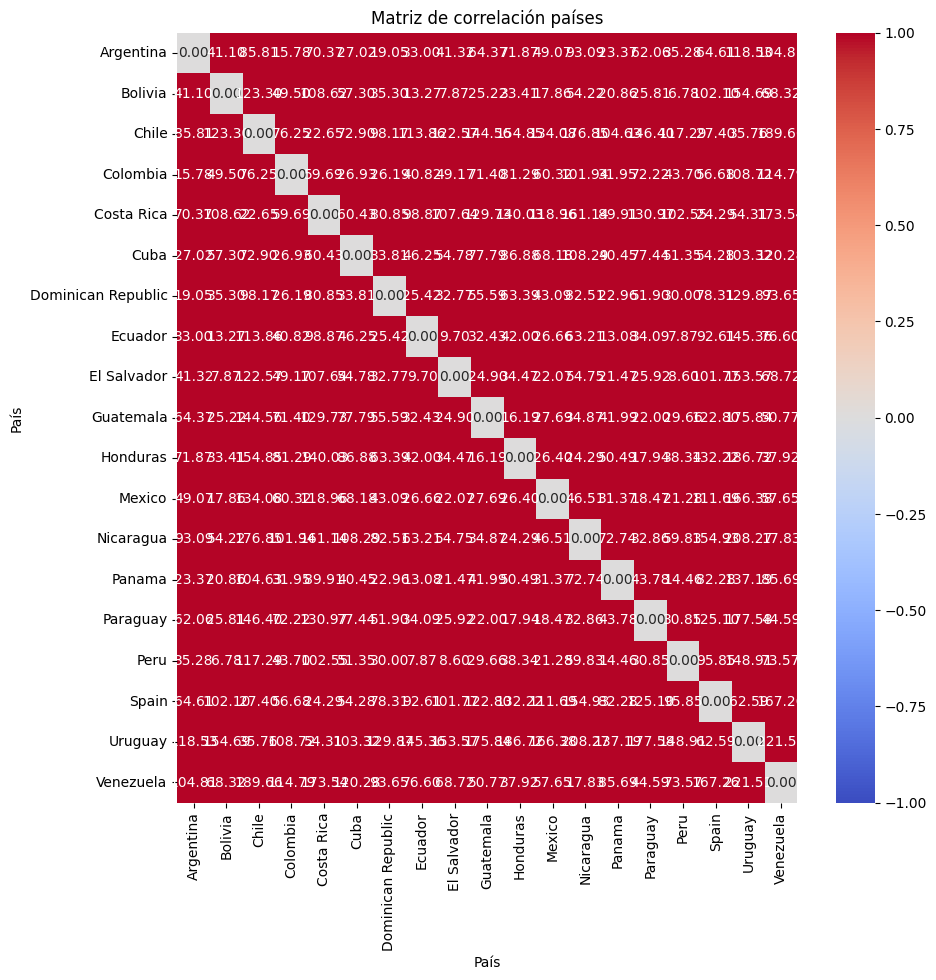

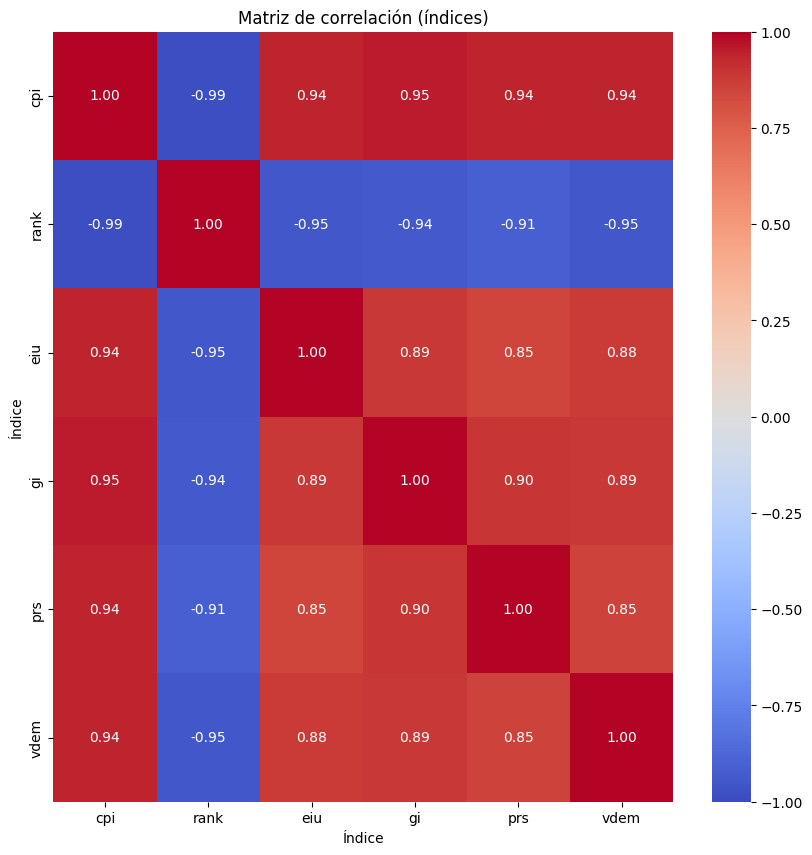

In [28]:
from sklearn.preprocessing import StandardScaler
from scipy.spatial.distance import pdist, squareform

X = df_index.copy()

# Asegura numérico y limpia inf
X = X.apply(pd.to_numeric, errors="coerce").replace([np.inf, -np.inf], np.nan)

# Imputa NaNs con mediana de cada columna
X_imp = X.fillna(X.median(numeric_only=True))

cpi = squareform(pdist(X_imp.values, metric="euclidean"))
corr_dict["cpi"] = pd.DataFrame(cpi, index=X_imp.index, columns=X_imp.index)

plt.figure(figsize=(10,10))
sns.heatmap(corr_dict['cpi'], annot=True, cmap="coolwarm", vmin=-1, vmax=1, fmt=".2f")
#sns.heatmap(np.abs(index_corr), annot=True, cmap="coolwarm", vmin=0, vmax=1, fmt=".1f")
plt.title("Matriz de correlación países")
plt.xlabel("País")
plt.ylabel("País")
plt.show()

#corrT = correlation(df_index.T)

corr_dict['index-index'] = df_index.corr()

plt.figure(figsize=(10,10))
#sns.heatmap(index_corr, annot=True, cmap="coolwarm", vmin=-1, vmax=1)
sns.heatmap(corr_dict['index-index'], annot=True, cmap="coolwarm", vmin=-1, vmax=1, fmt=".2f")
plt.title("Matriz de correlación (índices)")
plt.xlabel("Índice")
plt.ylabel("Índice")
plt.show()

## Rankings resultados de busqueda

In [29]:
# Leer el archivo JSON guardado
Nombre_Archivo = f"../datos/resultados_corrupcion.json"

with open(Nombre_Archivo, "r") as file:
    resultados = json.load(file)
for i in range(len(resultados)):
    if resultados[i]['country'] == 'Puerto Rico':
        resultados.pop(i)
        break
resultados.sort(key=lambda x: x['country'])

# Leer el archivo JSON guardado
Nombre_Archivo = f"../datos/res_unicos_corrupcion.json"

with open(Nombre_Archivo, "r") as file:
    all_hrefs = json.load(file)

max_len = max([len(r['search_results']['results']) for r in resultados])
rankings = {}
for r in resultados:
    pages = [all_hrefs.index(res['href']) for res in r['search_results']['results']]
    if len(pages) < max_len:
        diff = max_len - len(pages)
        pages += [np.nan] * diff
    rankings[r['country']] = pages
df_rankings = pd.DataFrame(rankings).T
df_rankings.sort_index(inplace=True)
df_dict["rankings"] = df_rankings
df_rankings

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
Argentina,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,...,90.0,91.0,92.0,93.0,94.0,95.0,96.0,97.0,98.0,99.0
Bolivia,0.0,1.0,3.0,5.0,2.0,4.0,28.0,100.0,55.0,101.0,...,153.0,154.0,155.0,97.0,156.0,157.0,65.0,158.0,59.0,NaN
Chile,1.0,4.0,159.0,160.0,3.0,2.0,5.0,33.0,161.0,144.0,...,51.0,208.0,116.0,209.0,125.0,210.0,211.0,212.0,139.0,82.0
Colombia,0.0,1.0,3.0,2.0,4.0,5.0,28.0,8.0,119.0,43.0,...,266.0,75.0,144.0,132.0,124.0,146.0,267.0,131.0,86.0,268.0
Costa Rica,1.0,3.0,2.0,4.0,5.0,158.0,28.0,269.0,270.0,271.0,...,137.0,59.0,82.0,125.0,155.0,298.0,299.0,300.0,NaN,NaN
Cuba,0.0,1.0,2.0,3.0,4.0,5.0,28.0,55.0,43.0,8.0,...,315.0,30.0,299.0,141.0,153.0,316.0,32.0,101.0,NaN,NaN
Dominican Republic,0.0,1.0,3.0,2.0,4.0,5.0,106.0,120.0,28.0,527.0,...,300.0,475.0,79.0,361.0,127.0,344.0,143.0,155.0,31.0,312.0
Ecuador,1.0,3.0,159.0,5.0,317.0,2.0,4.0,63.0,318.0,319.0,...,68.0,136.0,353.0,96.0,138.0,58.0,153.0,NaN,NaN,NaN
El Salvador,0.0,1.0,2.0,3.0,4.0,5.0,28.0,354.0,55.0,43.0,...,143.0,158.0,138.0,140.0,209.0,53.0,314.0,77.0,362.0,203.0
EspaÃ±a,1.0,159.0,4.0,2.0,3.0,33.0,5.0,563.0,87.0,8.0,...,348.0,307.0,123.0,65.0,594.0,595.0,18.0,86.0,596.0,12.0


## Matriz de distancia entre capitales

In [30]:
capital_coords = {
    "Argentina": (-34.6037, -58.3816),            # Buenos Aires
    "Bolivia": (-16.4897, -68.1193),              # La Paz (sede de gobierno)
    "Chile": (-33.4489, -70.6693),                 # Santiago
    "Colombia": (4.7110, -74.0721),                # Bogotá
    "Costa Rica": (9.9281, -84.0907),              # San José
    "Cuba": (23.1136, -82.3666),                   # La Habana
    "Ecuador": (-0.1807, -78.4678),                # Quito
    "El Salvador": (13.6929, -89.2182),            # San Salvador
    "Guatemala": (14.6349, -90.5061),              # Ciudad de Guatemala
    "Honduras": (14.0723, -87.1921),               # Tegucigalpa
    "Mexico": (19.4326, -99.1332),                 # Ciudad de México
    "Nicaragua": (12.1140, -86.2362),              # Managua
    "Panama": (8.9824, -79.5199),                  # Ciudad de Panamá
    "Paraguay": (-25.2637, -57.5759),              # Asunción
    "Peru": (-12.0464, -77.0428),                  # Lima
    #"Puerto Rico": (18.4655, -66.1057),            # San Juan
    "Dominican Republic": (18.4861, -69.9312),     # Santo Domingo
    "Uruguay": (-34.9011, -56.1645),               # Montevideo
    "Venezuela": (10.4806, -66.9036),              # Caracas
    "Spain": (40.4168, -3.7038)                    # Madrid
}

D = np.zeros((n_countries, n_countries), dtype=float)

for i, ci in enumerate(countries):
    for j, cj in enumerate(countries):
        if i == j:
            D[i, j] = 0.0
        else:
            D[i, j] = srl.haversine_km(capital_coords[ci], capital_coords[cj])

# DataFrame cuadrado país x país (normalizado 0..1)
corr_dict['geo'] = pd.DataFrame(D/D.max(), index=countries, columns=countries)
corr_dict['geo']

,Argentina,Bolivia,Chile,Colombia,Costa Rica,Cuba,Dominican Republic,Ecuador,El Salvador,Guatemala,Honduras,Mexico,Nicaragua,Panama,Paraguay,Peru,Spain,Uruguay,Venezuela
Argentina,0.000000,0.208884,0.106421,0.436413,0.527375,0.644683,0.563288,0.407404,0.586834,0.601879,0.580192,0.690724,0.557697,0.498319,0.097313,0.293159,0.938599,0.019177,0.475894
Bolivia,0.208884,0.000000,0.177817,0.228609,0.319833,0.436198,0.363872,0.199874,0.381119,0.396643,0.373023,0.489514,0.350660,0.289447,0.136945,0.100993,0.856755,0.221200,0.280501
Chile,0.106421,0.177817,0.000000,0.397893,0.469823,0.598986,0.539656,0.353945,0.523156,0.536891,0.520194,0.617647,0.497864,0.449454,0.145706,0.230461,1.000000,0.125480,0.457947
Colombia,0.436413,0.228609,0.397893,0.000000,0.116575,0.208529,0.149168,0.068297,0.181062,0.197184,0.165838,0.296273,0.146708,0.071599,0.353145,0.176794,0.748609,0.447272,0.095074
Costa Rica,0.527375,0.319833,0.469823,0.116575,0.000000,0.138064,0.167913,0.120046,0.065178,0.081429,0.053357,0.180385,0.031536,0.047864,0.453559,0.239630,0.792649,0.540678,0.175822
Cuba,0.644683,0.436198,0.598986,0.208529,0.138064,0.000000,0.129930,0.245213,0.118866,0.118942,0.105244,0.166666,0.120515,0.149533,0.561219,0.369306,0.695206,0.655775,0.201867
Dominican Republic,0.563288,0.363872,0.539656,0.149168,0.167913,0.129930,0.000000,0.212627,0.198743,0.208640,0.178053,0.286779,0.176177,0.138166,0.471416,0.325498,0.625708,0.571101,0.088568
Ecuador,0.407404,0.199874,0.353945,0.068297,0.120046,0.245213,0.212627,0.000000,0.181711,0.197489,0.173156,0.293000,0.150787,0.095825,0.334509,0.124158,0.816429,0.420632,0.162935
El Salvador,0.586834,0.381119,0.523156,0.181062,0.065178,0.118866,0.198743,0.181711,0.000000,0.016252,0.020813,0.115301,0.034367,0.110225,0.516219,0.295380,0.808345,0.600858,0.229057
Guatemala,0.601879,0.396643,0.536891,0.197184,0.081429,0.118942,0.208640,0.197489,0.016252,0.000000,0.033866,0.099113,0.050483,0.126174,0.531976,0.309924,0.812255,0.616056,0.243085


## Evaluaciones de cuestionario

In [31]:
df_responses = pd.read_csv("../datos/responses_llama.csv", sep='\t', header=0)

multi_choice = ['proposito',
                'informacion_presentada',
                'consecuencias',
                'intencion',
                'localidad_problema',
                'involucrados',
                'emociones']

possible_answers = {"tipo_entidad": ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i'],
                    "origen_entidad": ['a', 'b'],
                    "vision": ['a', 'b', 'c', 'd'],
                    'que_muestra': ['a', 'b', 'c', 'd'],
                    'formalidad': ['a', 'b'],
                    'nivel_educacion': ['a', 'b'],
                    'tono': ['a', 'b'],
                    "proposito": ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i'],
                    "informacion_presentada": ['a', 'b', 'c'],
                    "consecuencias": ['a', 'b', 'c', 'd'],
                    "intencion": ['a', 'b', 'c', 'd', 'e', 'f'],
                    "localidad_problema": ['a', 'b', 'c'],
                    "involucrados": ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h'],
                    "emociones": ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h']
                    }
single_questions = [q for q in possible_answers if q not in multi_choice]

# humano < 75% precision llama < 0.6
#bad_questions = ['proposito__d', 'tono', 'intencion__c', 'que_muestra', 'proposito__g', 'consecuencias__c', 'proposito__b', 'emociones__h', 'formalidad', 'localidad_problema__a']
bad_questions = ['proposito__d', 'tono', 'que_muestra', 'proposito__g', 'proposito__b', 'emociones__h', 'formalidad']
# humano < 75% precision llama <= 0.6
#bad_questions = ['proposito__d', 'tono', 'intencion__c', 'que_muestra', 'proposito__g', 'consecuencias__c', 'proposito__b', 'involucrados__f', 'origen_entidad', 'intencion__b', 'emociones__h', 'vision', 'intencion__a', 'formalidad', 'involucrados__b', 'tipo_entidad', 'localidad_problema__a', 'localidad_problema__b']
#bad_questions.remove('emociones__h') # se elimina emocion neutral
for q in bad_questions:
    if "__" not in q:
        for i in possible_answers.get(q, []):
            bad_questions.append(f"{q}__{i}")
bad_questions = [bad for bad in bad_questions if "__" in bad]

df_pag_info = srl.analyze_pages(df_responses, multi_choice, possible_answers)
df_pag_info = df_pag_info.drop(columns=bad_questions)
df_pag_info.index.name = 'page_id'
one_hot_cols = [col for col in df_pag_info.columns if df_pag_info[col].isin([0, 1]).all()]
df_pag_info_ordinal = srl.analyze_pages(df_responses, multi_choice, possible_answers, ordinal=True)
df_pag_info_ordinal = df_pag_info_ordinal.drop(columns=bad_questions)
df_dict["cuestionario"] = df_pag_info#[forms_best_feats]
#df_dict["cuestionario"] = df_pag_info[forms_clean_feats]
#df_dict["cuestionario_ordinal"] = df_pag_info_ordinal

df_dict['cuestionario']

,nivel_educacion__a,nivel_educacion__b,origen_entidad__a,origen_entidad__b,tipo_entidad__a,tipo_entidad__b,tipo_entidad__c,tipo_entidad__d,tipo_entidad__e,tipo_entidad__f,...,involucrados__f,involucrados__g,involucrados__h,emociones__a,emociones__b,emociones__c,emociones__d,emociones__e,emociones__f,emociones__g
page_id,,,,,,,,,,,,,,,,,,,,,
0,0,1,0,1,0,0,0,0,0,0,...,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000
1,0,1,0,1,0,0,0,0,0,0,...,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.333333,0.000000,0.000000
2,0,1,0,1,0,0,0,0,0,0,...,0.666667,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.333333,0.000000
3,0,1,0,1,0,0,1,0,0,0,...,0.333333,0.000000,0.333333,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000
4,0,1,0,1,0,0,0,0,0,0,...,1.000000,0.333333,0.000000,0.0,0.0,0.0,0.333333,0.333333,0.333333,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
592,0,1,1,0,0,0,0,1,0,0,...,0.333333,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.333333,0.000000,0.333333
593,0,1,0,1,0,0,0,0,0,0,...,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.333333,0.333333
594,0,1,1,0,0,1,0,0,0,0,...,0.666667,0.000000,0.333333,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.666667


## Robertuito

In [32]:
bad_labels = ['emotion__others', 'sentiment__NEU', 'irony__not ironic']
df_robertuito = pd.read_csv("../datos/robertuito_all_results.csv").drop(columns=bad_labels)
df_robertuito.set_index('pagina', inplace=True)
df_robertuito.index.name = 'page_id'
df_dict["robertuito"] = df_robertuito#[robertuito_best_feats]
df_robertuito

,emotion__joy,emotion__sadness,emotion__anger,emotion__fear,emotion__surprise,emotion__disgust,sentiment__NEG,sentiment__POS,hate__speech__hateful,hate__speech__targeted,hate__speech__aggressive,irony__ironic
page_id,,,,,,,,,,,,
12,0.00,0.02,0.75,0.0,0.01,0.09,0.84,0.01,0.04,0.01,0.02,0.00
571,0.00,0.00,0.00,0.0,0.00,0.00,0.09,0.05,0.03,0.01,0.02,0.13
200,0.00,0.00,0.00,0.0,0.00,0.00,0.07,0.12,0.02,0.01,0.01,0.01
394,0.00,0.00,0.00,0.0,0.00,0.00,0.07,0.15,0.02,0.01,0.02,0.01
397,0.00,0.01,0.04,0.0,0.00,0.00,0.65,0.03,0.03,0.01,0.03,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.01,0.00,0.00,0.0,0.00,0.00,0.10,0.14,0.02,0.01,0.01,0.08
9,0.00,0.00,0.00,0.0,0.00,0.00,0.17,0.09,0.02,0.00,0.01,0.00
575,0.00,0.01,0.64,0.0,0.00,0.05,0.32,0.03,0.02,0.00,0.02,0.01


## BOW

In [33]:
#df_dict['bow'] = pd.read_csv('../bow_pags_corrupcion.csv')
df_dict['bow'] = pd.read_csv('../datos/matriz_tfidf.csv', index_col=0)
df_dict['bow'].index.name = 'page_id'
#bow_cols_valid = [col for col in bow_best_feats if col in df_dict['bow'].columns]
#bow_cols_valid = [col for col in bow_clean_feats if col in df_dict['bow'].columns]
df_dict['bow'] = df_dict['bow']#[bow_cols_valid]
df_dict['bow']

,0,0 0,0 00,0 01,0 05,0 1,0 10,0 100,0 2,0 3,...,youtranscripts,youtranscripts com,youtube,z,zacatecas,zambia,zelanda,zelanda oman,zona,zonas
page_id,,,,,,,,,,,,,,,,,,,,,
0,0.013227,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.003564,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.037781,0.0,0.0,0.0,0.0,0.0,0.014403,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.029989,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
592,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
593,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
594,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.032588,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# Estadisticos

In [ ]:
_, wide = srl.compute_rank_feature_distance(df_dict['rankings'], df_dict['bow'], expanded=True)
relevance = srl.feature_relevance_multitarget(wide, df_dict["cpi"][['cpi']])
relevance['statistic'] = relevance['feature'].str.extract(r"_(mean|std|cum|diff|delta_cum)_s\d+$")
relevance['abs_rh'] = relevance['rh'].abs()  
relevance['option'] = relevance["feature"].str.replace( r"_(?:mean|std|cum|diff|delta_cum)_s\d+$", "", regex=True )
relevance

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


,feature,rh,p,n,p_fdr,target,statistic,abs_rh,option
0,capacitar_delta_cum_s8,0.881747,6.043963e-07,19,NaN,cpi,delta_cum,0.881747,capacitar
1,testigos_mean_s8,0.852679,3.530821e-06,19,NaN,cpi,mean,0.852679,testigos
2,fomentar_delta_cum_s8,0.850747,3.917182e-06,19,NaN,cpi,delta_cum,0.850747,fomentar
3,convención interamericana_mean_s8,0.849747,4.131168e-06,19,NaN,cpi,mean,0.849747,convención interamericana
4,testigos_std_s8,0.849466,4.192980e-06,19,NaN,cpi,std,0.849466,testigos
...,...,...,...,...,...,...,...,...,...
499995,únicos_delta_cum_s1,NaN,NaN,19,NaN,cpi,delta_cum,NaN,únicos
499996,útil_delta_cum_s1,NaN,NaN,19,NaN,cpi,delta_cum,NaN,útil
499997,útiles_delta_cum_s1,NaN,NaN,19,NaN,cpi,delta_cum,NaN,útiles
499998,русский_delta_cum_s1,NaN,NaN,19,NaN,cpi,delta_cum,NaN,русский


In [ ]:
_, wide = srl.compute_rank_feature_distance(df_dict['rankings'], df_dict['cuestionario'], onehot_cols=one_hot_cols, expanded=True)
relevance = srl.feature_relevance_multitarget(wide, df_dict["cpi"][['cpi']])
relevance['statistic'] = relevance['feature'].str.extract(r"_(mean|std|cum|diff|delta_cum)_s\d+$")
relevance['abs_rh'] = relevance['rh'].abs()  
relevance['option'] = relevance["feature"].str.replace( r"_(?:mean|std|cum|diff|delta_cum)_s\d+$", "", regex=True ) 
relevance

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


,feature,rh,p,n,p_fdr,target,statistic,abs_rh,option
0,emociones__b_delta_cum_s8,0.694737,0.000963,19,NaN,cpi,delta_cum,0.694737,emociones__b
1,emociones__b_mean_s8,0.671552,0.001641,19,NaN,cpi,mean,0.671552,emociones__b
2,emociones__b_std_s8,0.671552,0.001641,19,NaN,cpi,std,0.671552,emociones__b
3,intencion__c_cum_s9,0.663158,0.001968,19,NaN,cpi,cum,0.663158,intencion__c
4,intencion__c_cum_s10,0.663158,0.001968,19,NaN,cpi,cum,0.663158,intencion__c
...,...,...,...,...,...,...,...,...,...
2695,involucrados__h_delta_cum_s1,NaN,NaN,19,NaN,cpi,delta_cum,NaN,involucrados__h
2696,emociones__a_delta_cum_s1,NaN,NaN,19,NaN,cpi,delta_cum,NaN,emociones__a
2697,emociones__b_delta_cum_s1,NaN,NaN,19,NaN,cpi,delta_cum,NaN,emociones__b
2698,emociones__c_delta_cum_s1,NaN,NaN,19,NaN,cpi,delta_cum,NaN,emociones__c


In [18]:
_, wide = srl.compute_rank_feature_distance(df_dict['rankings'], df_dict['cuestionario'], expanded=True)
relevance = srl.feature_relevance_multitarget(wide, df_dict["cpi"][['cpi']])
relevance['statistic'] = relevance['feature'].str.extract(r"_(mean|std|cum|diff|delta_cum)_s\d+$")
relevance['abs_rh'] = relevance['rh'].abs()  
relevance['option'] = relevance["feature"].str.replace( r"_(?:mean|std|cum|diff|delta_cum)_s\d+$", "", regex=True ) 
relevance#.groupby(['statistic'])[['abs_rh','p']].mean()

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib_backup.py:769: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


,feature,rh,p,n,p_fdr,target,statistic,abs_rh,option
0,tipo_entidad__c_mean_s9,0.693664,0.001409,18,NaN,cpi,mean,0.693664,tipo_entidad__c
1,tipo_entidad__c_std_s9,0.693664,0.001409,18,NaN,cpi,std,0.693664,tipo_entidad__c
2,tipo_entidad__c_diff_s9,0.655540,0.003142,18,NaN,cpi,diff,0.655540,tipo_entidad__c
3,emociones__b_delta_cum_s8,0.653251,0.003286,18,NaN,cpi,delta_cum,0.653251,emociones__b
4,intencion__c_cum_s10,0.634675,0.004663,18,NaN,cpi,cum,0.634675,intencion__c
...,...,...,...,...,...,...,...,...,...
645,involucrados__h_delta_cum_s1,NaN,NaN,18,NaN,cpi,delta_cum,NaN,involucrados__h
646,emociones__b_delta_cum_s1,NaN,NaN,18,NaN,cpi,delta_cum,NaN,emociones__b
647,involucrados__g_delta_cum_s1,NaN,NaN,18,NaN,cpi,delta_cum,NaN,involucrados__g
648,consecuencias__c_delta_cum_s1,NaN,NaN,18,NaN,cpi,delta_cum,NaN,consecuencias__c


In [11]:
relevance.groupby(['statistic'])[['abs_rh','p']].mean()

,abs_rh,p
statistic,,
cum,0.240406,0.410392
delta_cum,0.186391,0.511745
diff,0.170962,0.536504
mean,0.194552,0.492134
std,0.186629,0.504866


In [13]:
statistics_relevance = relevance.groupby(['statistic', 'option'], as_index=False)[['abs_rh','p']].mean().dropna(subset=['abs_rh'])
statistics_relevance.sort_values(['statistic', 'abs_rh'], ascending=[True, False], inplace=True)
statistics_relevance.sort_values(['abs_rh'], ascending=False, inplace=True)
#statistics_relevance[statistics_relevance['statistic'] == 'cum']
statistics_relevance

,statistic,option,abs_rh,p
2,cum,consecuencias__c,0.510807,0.035239
17,cum,intencion__d,0.509524,0.043704
21,cum,involucrados__b,0.496713,0.103928
48,cum,tipo_entidad__h,0.487256,0.037200
0,cum,consecuencias__a,0.465817,0.059775
...,...,...,...,...
32,cum,nivel_educacion__b,0.076287,0.762203
10,cum,emociones__g,0.075841,0.772235
31,cum,nivel_educacion__a,0.072145,0.771460
53,cum,vision__d,0.066132,0.793760


In [45]:
_, wide = srl.compute_rank_feature_distance(df_dict['rankings'], df_dict['bow'], expanded=True, by='correlation', compare_to=df_dict['cpi'][['cpi']])
relevance = srl.feature_relevance_multitarget(wide, df_dict["cpi"][['cpi']])
relevance['statistic'] = relevance['feature'].str.extract(r"_(mean|std|cum|diff|delta_cum)_s\d+$")
relevance['abs_rh'] = relevance['rh'].abs()  
relevance['option'] = relevance["feature"].str.split('_').str[0]
relevance

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


,feature,rh,p,n,p_fdr,target,statistic,abs_rh,option
0,desarrollo social_diff_s9,-0.914336,4.372937e-08,19,0.000002,cpi,diff,0.914336,desarrollo social
1,interesados_std_s6,-0.869756,1.316613e-06,19,0.000021,cpi,std,0.869756,interesados
2,interesados_mean_s6,-0.874627,9.687870e-07,19,0.000021,cpi,mean,0.874627,interesados
3,desarrollo social_mean_s8,0.823494,1.477449e-05,19,0.000157,cpi,mean,0.823494,desarrollo social
4,desarrollo social_std_s8,0.819383,1.770276e-05,19,0.000157,cpi,std,0.819383,desarrollo social
5,interesados_delta_cum_s6,-0.816506,2.003772e-05,19,0.000157,cpi,delta_cum,0.816506,interesados
6,circulación_cum_s2,0.773796,1.014787e-04,19,0.000677,cpi,cum,0.773796,circulación
7,presentarse_cum_s6,-0.770028,1.151598e-04,19,0.000677,cpi,cum,0.770028,presentarse
8,figuran_cum_s3,0.764307,1.389316e-04,19,0.000726,cpi,cum,0.764307,figuran
9,presentarse_delta_cum_s8,0.754657,1.885086e-04,19,0.000738,cpi,delta_cum,0.754657,presentarse


In [47]:
relevance.groupby(['option'])[['abs_rh','p']].mean().sort_values('abs_rh', ascending=False)

,abs_rh,p
option,,
interesados,0.813515,0.000256
figuran,0.764307,0.000139
desarrollo social,0.743346,0.001015
presentarse,0.715765,0.000984
dades,0.707222,0.001052
corrupción resultado,0.700224,0.001575
circulación,0.659016,0.003030
lacra,0.654496,0.002775
rss,0.650747,0.003077


In [19]:
statistics_relevance = relevance.groupby(['statistic', 'option'], as_index=False)[['abs_rh','p']].mean().dropna(subset=['abs_rh'])
statistics_relevance.sort_values(['statistic', 'abs_rh'], ascending=[True, False], inplace=True)
#statistics_relevance.sort_values(['abs_rh'], ascending=False, inplace=True)
#statistics_relevance[statistics_relevance['statistic'] == 'cum']
statistics_relevance

,statistic,option,abs_rh,p
2,cum,emociones__b,0.690085,0.001121
4,cum,intencion__c,0.663158,0.001968
5,cum,involucrados__b,0.653375,0.003216
0,cum,consecuencias__a,0.651163,0.002529
3,cum,intencion__a,0.608772,0.005672
1,cum,consecuencias__c,0.603509,0.006222
7,delta_cum,emociones__b,0.694737,0.000963
8,delta_cum,emociones__e,0.659649,0.002121
6,delta_cum,consecuencias__b,0.649123,0.002637
9,delta_cum,involucrados__e,0.602896,0.006289


In [ ]:
thr = 0.65
_, wide = srl.compute_rank_feature_distance(df_dict['rankings'], df_dict['cuestionario'], onehot_cols=one_hot_cols, expanded=True, by='correlation', threshold=thr, compare_to=df_dict['cpi'][['cpi']])
relevance = srl.feature_relevance_multitarget(wide, df_dict["cpi"][['cpi']])
relevance['statistic'] = relevance['feature'].str.extract(r"_(mean|std|cum|diff|delta_cum)_s\d+$")
relevance['abs_rh'] = relevance['rh'].abs()  
relevance['option'] = relevance["feature"].str.replace( r"_(?:mean|std|cum|diff|delta_cum)_s\d+$", "", regex=True ) 
relevance.groupby(['statistic'])[['abs_rh','p']].mean()

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


,abs_rh,p
statistic,,
cum,0.681211,0.001470
delta_cum,0.677193,0.001542
mean,0.661922,0.002056
std,0.671552,0.001641


In [ ]:
thr = 0.7
_, wide = srl.compute_rank_feature_distance(df_dict['rankings'], df_dict['cuestionario'], onehot_cols=one_hot_cols, expanded=True, by='correlation', threshold=thr, compare_to=df_dict['cpi'][['cpi']])
relevance = srl.feature_relevance_multitarget(wide, df_dict["cpi"][['cpi']])
relevance['statistic'] = relevance['feature'].str.extract(r"_(mean|std|cum|diff|delta_cum)_s\d+$")
relevance['abs_rh'] = relevance['rh'].abs()  
relevance['option'] = relevance["feature"].str.replace( r"_(?:mean|std|cum|diff|delta_cum)_s\d+$", "", regex=True ) 
relevance.groupby(['statistic'])[['abs_rh','p']].mean()

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


,abs_rh,p
statistic,,
cum,0.712305,0.000636


In [ ]:
thr = 0.72
_, wide = srl.compute_rank_feature_distance(df_dict['rankings'], df_dict['cuestionario'], onehot_cols=one_hot_cols, expanded=True, by='correlation', threshold=thr, compare_to=df_dict['cpi'][['cpi']])
relevance = srl.feature_relevance_multitarget(wide, df_dict["cpi"][['cpi']])
relevance['statistic'] = relevance['feature'].str.extract(r"_(mean|std|cum|diff|delta_cum)_s\d+$")
relevance['abs_rh'] = relevance['rh'].abs()  
relevance['option'] = relevance["feature"].str.replace( r"_(?:mean|std|cum|diff|delta_cum)_s\d+$", "", regex=True ) 
relevance.groupby(['statistic'])[['abs_rh','p']].mean()

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  for feat in feats.columns:


,abs_rh,p
statistic,,
cum,0.721053,0.000495


# Analisis con caracteristicas mas relevantes

## Binarias
### Todas las caracteristicas

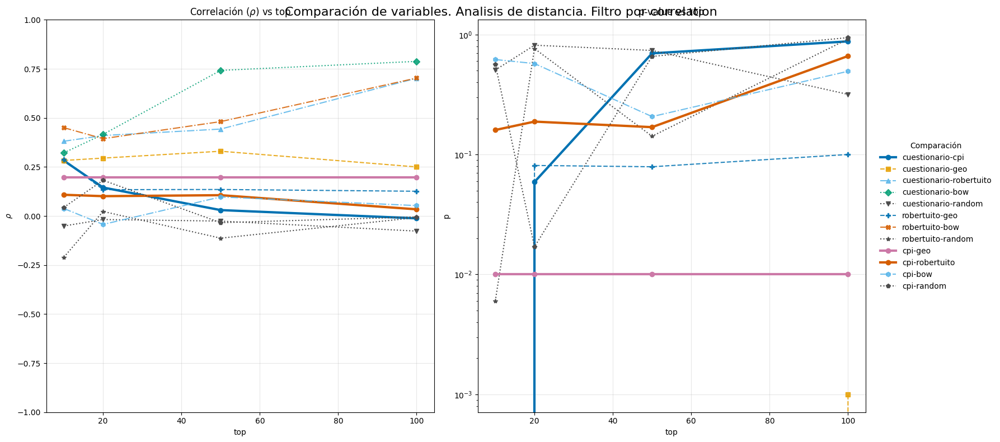

In [ ]:
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

### Ponderados y sin resultados comunes

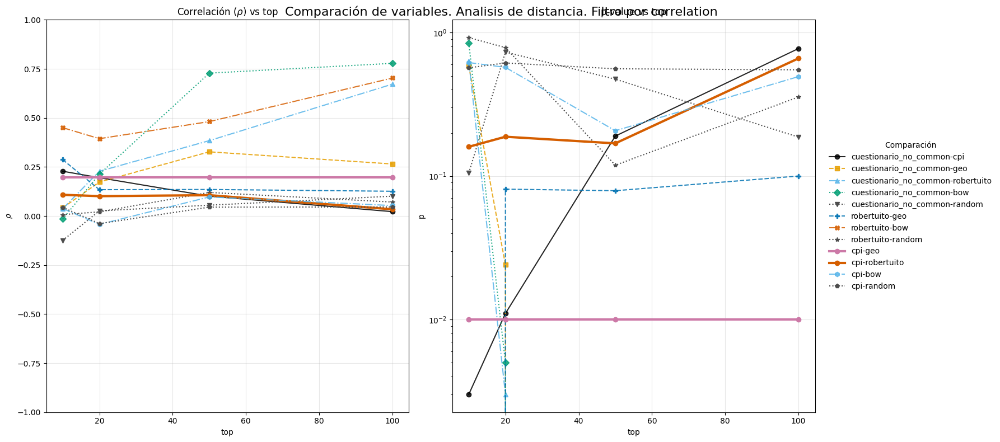

In [ ]:
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres_no_common.keys(),
    ignore=ignore_no_common, 
    segmentation=segmentation, 
    one_hot_cols=one_hot_cols, 
    expanded=True,
    suffix='_no_common',
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

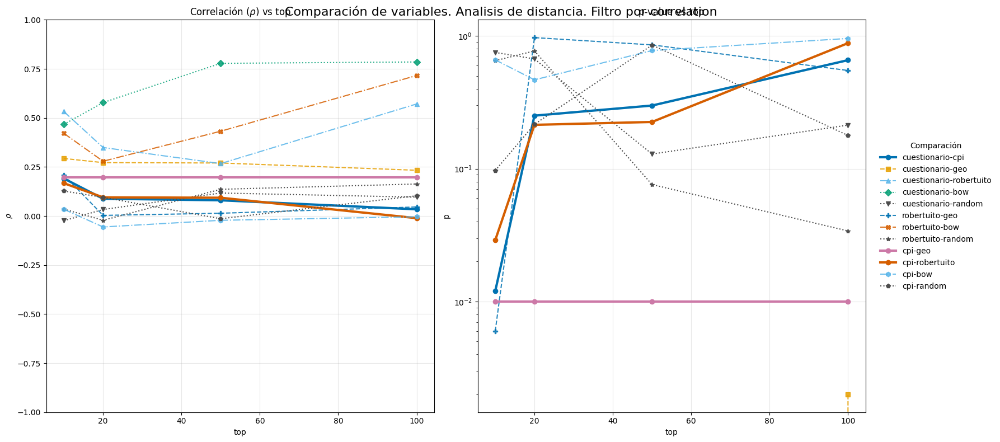

In [ ]:
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='ponderate',
    keys=thres.keys(),
    ignore=ignore, 
    segmentation=segmentation, 
    one_hot_cols=one_hot_cols, 
    expanded=True
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

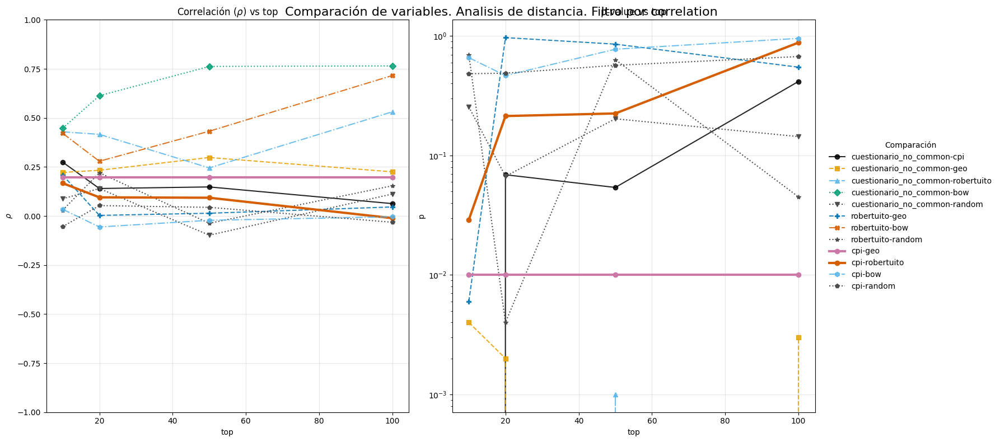

In [19]:
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='ponderate',
    keys=thres_no_common.keys(),
    ignore=ignore_no_common, 
    segmentation=segmentation, 
    one_hot_cols=one_hot_cols, 
    expanded=True,
    suffix='_no_common',
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

#### Comparacion segmentos vs promedio

Comparación con segmentos


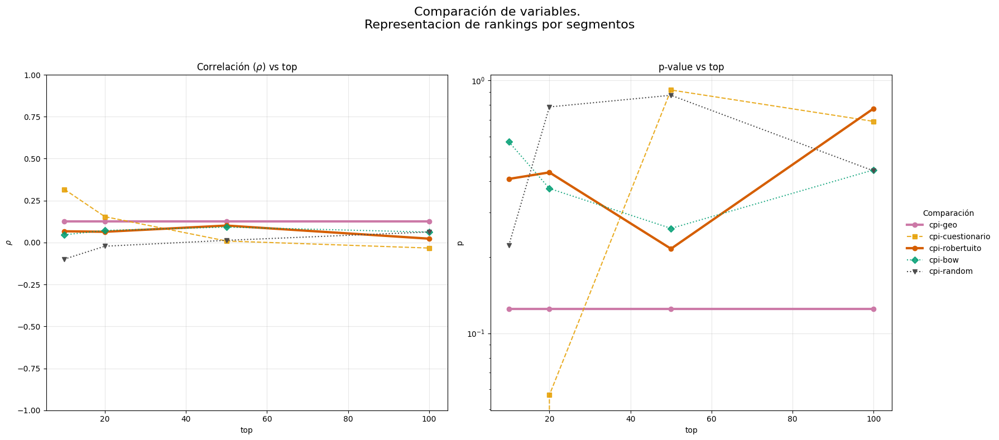

Comparación con promedio


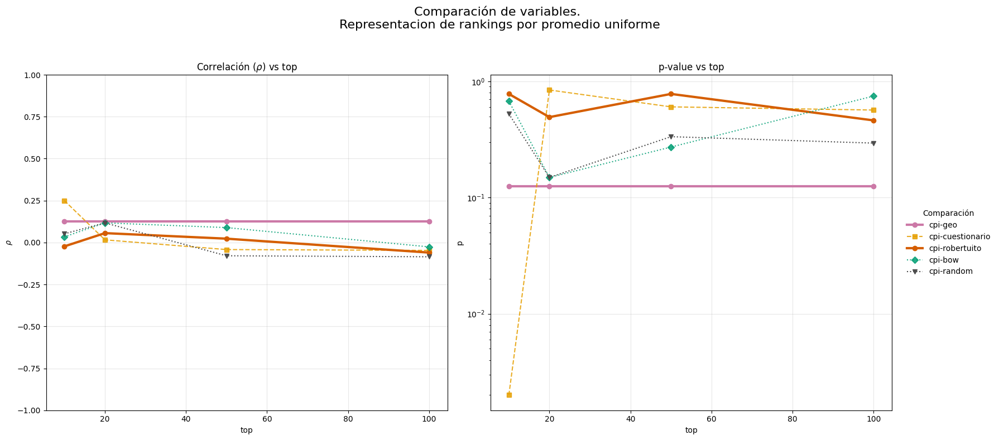

Comparación con promedio ponderado (1/rank)


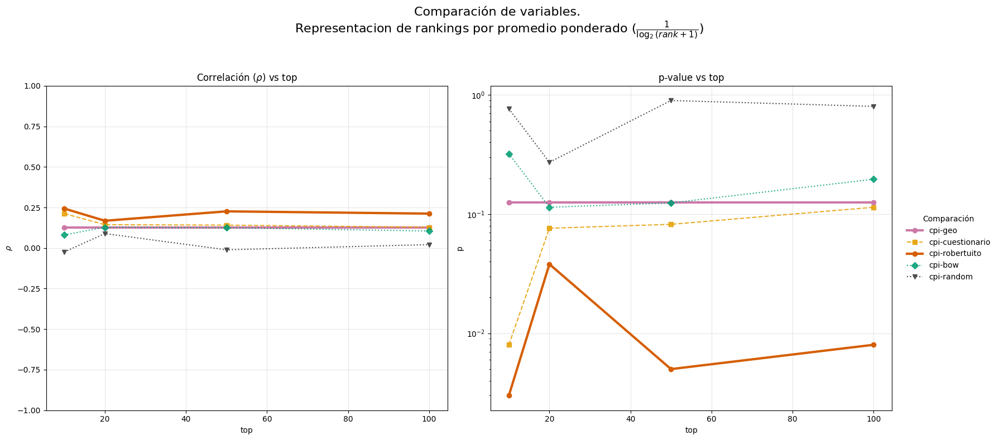

Comparación con promedio ponderado (1/log(rank))


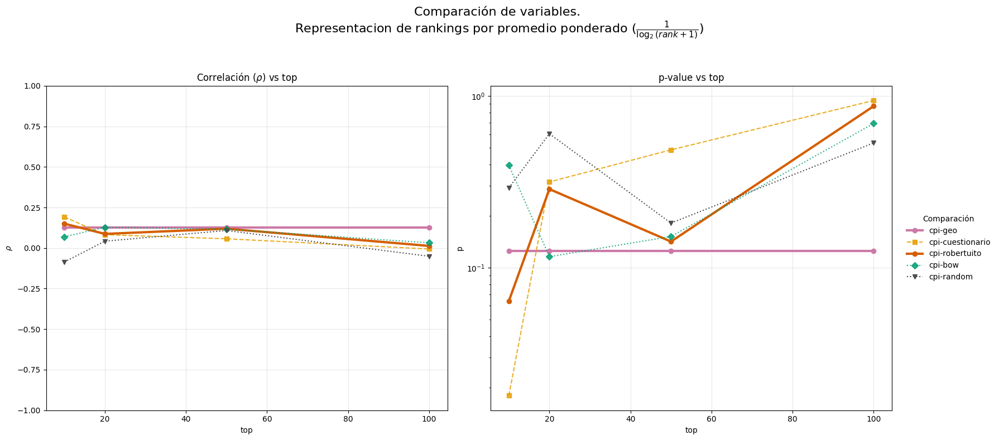

In [ ]:
print("Comparación con segmentos")
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='no_filter',
    compare_to=df_dict['cpi'][['cpi']],
    min_features_ratio=20
)
srl.graph_comparison(
    wide_r, 
    wide_p, 
    extra = "\nRepresentacion de rankings por segmentos",
    highlight_palette=HIGHLIGHT_COLORS
)

print("Comparación con promedio")
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='ponderate',
    weight_func=lambda rank: 1,
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='no_filter',
    compare_to=df_dict['cpi'][['cpi']],
    min_features_ratio=20
)
srl.graph_comparison(
    wide_r, 
    wide_p, 
    extra = "\nRepresentacion de rankings por promedio uniforme",
    highlight_palette=HIGHLIGHT_COLORS
)

print("Comparación con promedio ponderado (1/rank)")
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='ponderate',
    weight_func=lambda rank: 1/(rank+1),
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='no_filter',
    compare_to=df_dict['cpi'][['cpi']],
    min_features_ratio=20
)
srl.graph_comparison(
    wide_r, 
    wide_p, 
    extra = "\n"+r"Representacion de rankings por promedio ponderado ($\frac{1}{rank+1}$)",
    highlight_palette=HIGHLIGHT_COLORS
)

print("Comparación con promedio ponderado (1/log(rank))")
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='ponderate',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='no_filter',
    compare_to=df_dict['cpi'][['cpi']],
    min_features_ratio=20
)
srl.graph_comparison(
    wide_r, 
    wide_p, 
    extra = "\n"+r"Representacion de rankings por promedio ponderado ($\frac{1}{\log_2(rank+1)}$)",
    highlight_palette=HIGHLIGHT_COLORS
)

Comparación con promedio ponderado (1/rank)
Advertencia: El threshold 0.6 seleccionó solo 1 características (mínimo deseado: 20). Ajustando a 0.2838.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.2508 para mantener 20 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3292 para mantener 20 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 1 características (mínimo deseado: 20). Ajustando a 0.3106.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


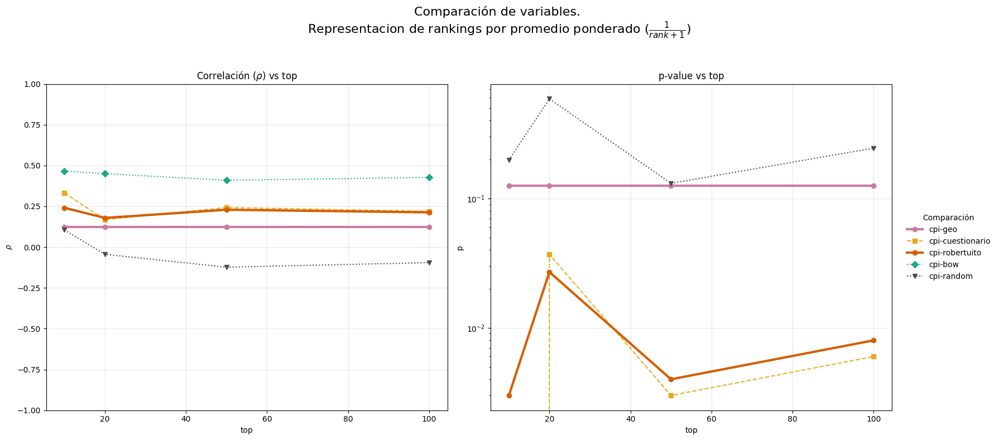

Comparación con promedio ponderado (1/log(rank))
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.2838 para mantener 20 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.2363 para mantener 20 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 1 características (mínimo deseado: 20). Ajustando a 0.2632.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 1 características (mínimo deseado: 20). Ajustando a 0.2632.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


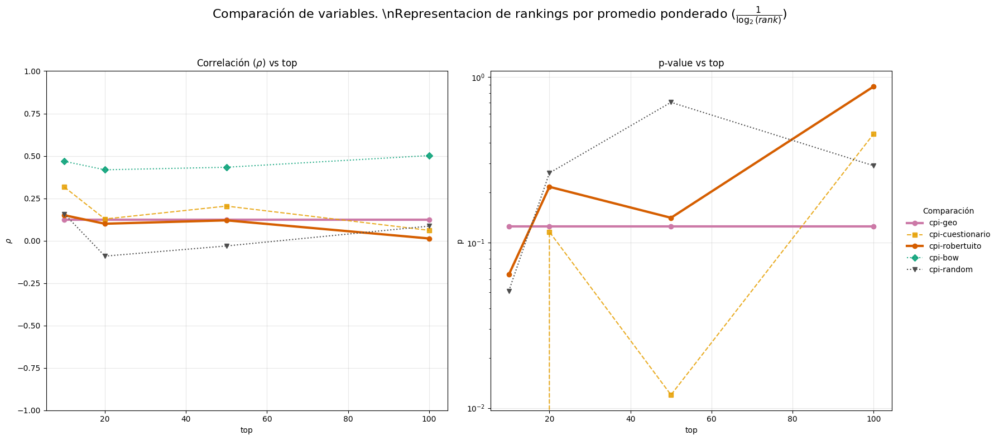

In [28]:
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'bow': t
}
'''
print("Comparación con segmentos")
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation',
    compare_to=df_dict['cpi'][['cpi']],
    min_features_ratio=20
)
srl.graph_comparison(
    wide_r, 
    wide_p, 
    extra = "\nRepresentacion de rankings por segmentos",
    highlight_palette=HIGHLIGHT_COLORS
)

print("Comparación con promedio")
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='ponderate',
    weight_func=lambda rank: 1,
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation',
    compare_to=df_dict['cpi'][['cpi']],
    min_features_ratio=20
)
srl.graph_comparison(
    wide_r, 
    wide_p, 
    extra = "\n"+r"Representacion de rankings por promedio uniforme",
    highlight_palette=HIGHLIGHT_COLORS
)
'''
print("Comparación con promedio ponderado (1/rank)")
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='ponderate',
    weight_func=lambda rank: 1/(rank+1),
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation',
    compare_to=df_dict['cpi'][['cpi']],
    min_features_ratio=20
)
srl.graph_comparison(
    wide_r, 
    wide_p, 
    extra = "\n"+r"Representacion de rankings por promedio ponderado ($\frac{1}{rank+1}$)",
    highlight_palette=HIGHLIGHT_COLORS
)

print("Comparación con promedio ponderado (1/log(rank))")
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='ponderate',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation',
    compare_to=df_dict['cpi'][['cpi']],
    min_features_ratio=20
)
srl.graph_comparison(
    wide_r, 
    wide_p, 
    extra = r"\nRepresentacion de rankings por promedio ponderado ($\frac{1}{\log_2(rank)}$)",
    highlight_palette=HIGHLIGHT_COLORS
)

### Relacion por distancia vs correlacion

#### Solo filtro por correlacion

In [15]:
_, wide = srl.compute_rank_feature_distance(df_dict['rankings'], df_dict['cuestionario'], expanded=True)
relevance = srl.feature_relevance_multitarget(wide, df_dict["cpi"][['cpi']])
relevance['statistic'] = relevance['feature'].str.extract(r"_(mean|std|cum|diff|delta_cum)_s\d+$")
relevance['abs_rh'] = relevance['rh'].copy().abs()  
relevance['option'] = relevance["feature"].str.replace( r"_(?:mean|std|cum|diff|delta_cum)_s\d+$", "", regex=True ) 
l2 = relevance[relevance['abs_rh']>0.6]['option'].unique()#.groupby(['statistic'])[['abs_rh','p']].mean()

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


In [19]:
relevance[relevance['abs_rh']>0.6].groupby('option')[['rh', 'abs_rh','p']].mean().sort_values('abs_rh', ascending=False)

,rh,abs_rh,p
option,,,
tipo_entidad__c,0.342227,0.679207,0.002031
involucrados__b,-0.650683,0.650683,0.003635
emociones__b,0.117416,0.639736,0.004444
involucrados__g,-0.636153,0.636153,0.004539
intencion__c,0.633643,0.633643,0.004752
consecuencias__a,0.624677,0.624677,0.005579
emociones__e,-0.615528,0.615528,0.006783
consecuencias__b,0.609907,0.609907,0.007197
involucrados__c,-0.603242,0.603242,0.008041


In [ ]:
_, wide = srl.compute_rank_feature_distance(df_dict['rankings'], df_dict['bow'], expanded=True)
relevance = srl.feature_relevance_multitarget(wide, df_dict["cpi"][['cpi']])
relevance['statistic'] = relevance['feature'].str.extract(r"_(mean|std|cum|diff|delta_cum)_s\d+$")
relevance['abs_rh'] = relevance['rh'].abs()  
relevance['option'] = relevance["feature"].str.replace( r"_(?:mean|std|cum|diff|delta_cum)_s\d+$", "", regex=True ) 
relevance[relevance['abs_rh']>0.6]['option'].unique()#.groupby(['statistic'])[['abs_rh','p']].mean()

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


,rh,abs_rh,p
option,,,
madrid,-0.869969,0.869969,0.000003
zonas,0.833260,0.833260,0.000023
referirse,-0.833060,0.833060,0.000020
desempena,-0.827171,0.827171,0.000023
lavado activos,0.809246,0.809246,0.000048
...,...,...,...
termino corrupcion,0.600463,0.600463,0.008416
5 ley,0.600219,0.600219,0.008449
pudieron,0.600207,0.600207,0.008451


In [30]:
r = relevance[relevance['abs_rh']>0.6].groupby('option')[['rh', 'abs_rh','p']].mean().sort_values('abs_rh', ascending=False)
r.shape

(1971, 3)

In [31]:
for i in ['madrid', 'zonas', 'dominacion', 'referirse', 'eficientemente',
       'discrecionalidad', 'intercambio', 'aceptado', 'complicidad',
       'etica gubernamental']:
    print(r.loc[i])

rh       -0.869969
abs_rh    0.869969
p         0.000003
Name: madrid, dtype: float64
rh        0.833260
abs_rh    0.833260
p         0.000023
Name: zonas, dtype: float64
rh       -0.215046
abs_rh    0.724624
p         0.001935
Name: dominacion, dtype: float64
rh       -0.83306
abs_rh    0.83306
p         0.00002
Name: referirse, dtype: float64
rh        0.226129
abs_rh    0.754081
p         0.002068
Name: eficientemente, dtype: float64
rh        0.371145
abs_rh    0.708090
p         0.002160
Name: discrecionalidad, dtype: float64
rh       -0.230862
abs_rh    0.721099
p         0.001631
Name: intercambio, dtype: float64
rh        0.691676
abs_rh    0.691676
p         0.003274
Name: aceptado, dtype: float64
rh       -0.478944
abs_rh    0.670894
p         0.003936
Name: complicidad, dtype: float64
rh       -0.148732
abs_rh    0.803896
p         0.000184
Name: etica gubernamental, dtype: float64


In [31]:
wide

,nivel_educacion__a_mean_s1,nivel_educacion__a_mean_s2,nivel_educacion__a_mean_s3,nivel_educacion__a_mean_s4,nivel_educacion__a_mean_s5,nivel_educacion__a_mean_s6,nivel_educacion__a_mean_s7,nivel_educacion__a_mean_s8,nivel_educacion__a_mean_s9,nivel_educacion__a_mean_s10,...,emociones__g_delta_cum_s1,emociones__g_delta_cum_s2,emociones__g_delta_cum_s3,emociones__g_delta_cum_s4,emociones__g_delta_cum_s5,emociones__g_delta_cum_s6,emociones__g_delta_cum_s7,emociones__g_delta_cum_s8,emociones__g_delta_cum_s9,emociones__g_delta_cum_s10
country_id,,,,,,,,,,,,,,,,,,,,,
Argentina,0.1,0.0,0.000000,0.0,0.0,0.000000,0.0,0.111111,0.0,0.0,...,0.000000e+00,0.000000,0.066667,0.100000,0.026667,-0.088889,-0.019048,-0.000463,-0.076132,-0.038519
Bolivia,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,...,0.000000e+00,0.100000,-0.044444,0.030556,0.024444,-0.072222,0.160317,-0.063889,-0.046914,0.072791
Chile,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,...,0.000000e+00,0.030093,-0.029938,0.155324,-0.012037,-0.037809,-0.118122,-0.078356,-0.006158,-0.065542
Colombia,0.0,0.0,0.000000,0.0,0.0,0.111111,0.0,0.000000,0.0,0.0,...,0.000000e+00,-0.025000,-0.016667,0.063889,0.080741,0.067284,0.045767,-0.045023,0.120473,0.012593
Costa Rica,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,...,0.000000e+00,0.033333,0.022222,-0.008333,-0.077778,0.009259,0.122222,-0.038889,-0.108642,-0.088840
Cuba,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,...,0.000000e+00,0.050000,-0.011111,-0.033333,0.071111,-0.033333,0.047619,0.028704,-0.073251,-0.058768
Dominican Republic,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,...,0.000000e+00,0.075000,0.005556,-0.020833,-0.034444,0.002160,-0.017989,-0.008449,0.038580,-0.011944
Ecuador,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,...,0.000000e+00,0.033333,-0.022222,0.108333,0.080741,-0.037654,0.067725,-0.042824,0.021193,0.010827
El Salvador,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.1,...,0.000000e+00,0.083333,-0.011111,-0.008333,-0.080741,0.117901,0.010355,-0.040939,-0.036390,-0.062751


In [32]:
corr_dict['cuestionario']

,Argentina,Bolivia,Chile,Colombia,Costa Rica,Cuba,Dominican Republic,Ecuador,El Salvador,Guatemala,Honduras,Mexico,Nicaragua,Panama,Paraguay,Peru,Uruguay,Venezuela
Argentina,0.000000,20.486921,26.051955,22.729164,24.743256,22.277392,22.779087,22.283423,23.107585,20.869302,23.814866,23.417243,23.045975,21.057687,27.922118,21.681102,24.278148,22.295849
Bolivia,20.486921,0.000000,20.701056,14.490257,17.151693,11.309901,15.164392,15.152689,9.740143,11.496886,13.248158,19.498191,14.834520,12.429911,19.090388,13.205818,15.019135,15.782922
Chile,26.051955,20.701056,0.000000,21.139391,23.170975,20.630668,21.977666,21.865362,19.891988,21.308460,21.560111,26.738708,22.610579,21.280403,21.478625,21.176402,23.428213,24.688532
Colombia,22.729164,14.490257,21.139391,0.000000,19.558546,7.302325,11.631087,14.602133,12.456543,13.851733,12.085802,15.951611,15.961490,14.463114,18.492512,9.524380,13.923335,15.769890
Costa Rica,24.743256,17.151693,23.170975,19.558546,0.000000,18.413359,20.399156,19.373804,18.005450,16.515069,18.913633,23.613120,21.347091,17.437195,22.864966,19.901270,18.048503,21.135544
Cuba,22.277392,11.309901,20.630668,7.302325,18.413359,0.000000,10.826688,13.160570,9.554486,11.935328,10.284942,15.439617,14.199814,13.730714,17.589432,7.292508,13.633540,15.833921
Dominican Republic,22.779087,15.164392,21.977666,11.631087,20.399156,10.826688,0.000000,14.444373,12.357996,11.668382,8.882760,15.953865,15.243689,14.666857,19.335524,8.642190,15.618418,16.059973
Ecuador,22.283423,15.152689,21.865362,14.602133,19.373804,13.160570,14.444373,0.000000,13.964618,15.310098,14.468387,19.790904,18.337883,13.466670,19.756150,13.578587,16.365013,19.244422
El Salvador,23.107585,9.740143,19.891988,12.456543,18.005450,9.554486,12.357996,13.964618,0.000000,9.359665,8.786441,19.231287,12.447370,12.785119,17.454325,12.325454,13.649422,15.983318
Guatemala,20.869302,11.496886,21.308460,13.851733,16.515069,11.935328,11.668382,15.310098,9.359665,0.000000,9.537153,18.428344,13.460358,11.570980,19.728809,11.470413,15.035689,14.036032


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4035 para mantener 20 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4205 para mantener 20 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 2 características (mínimo deseado: 20). Ajustando a 0.5116.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: A

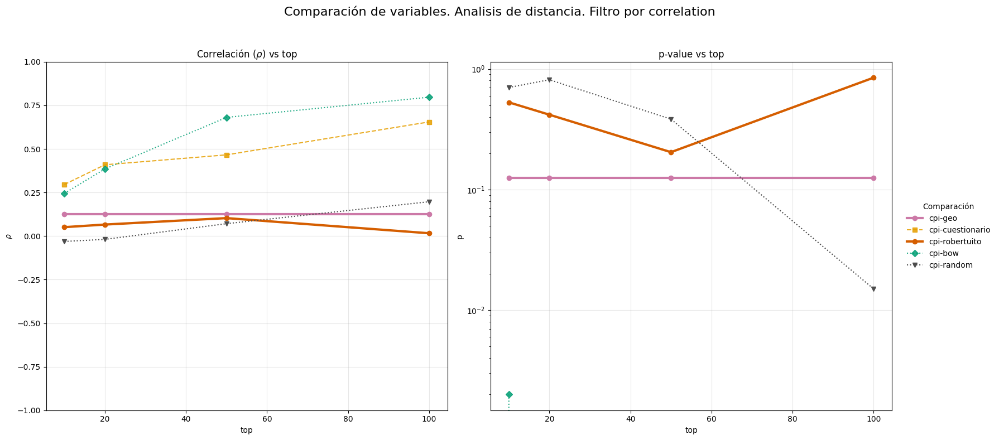

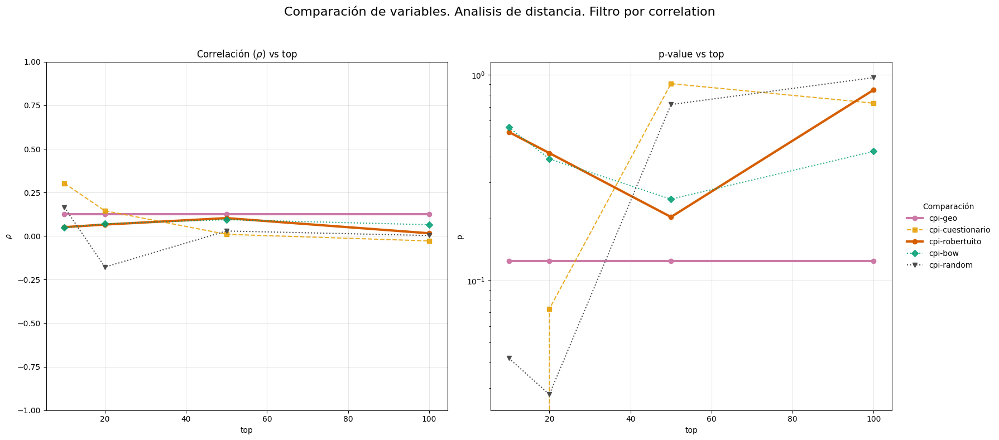

In [ ]:
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'bow': t
}
# CORRELACION
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation',
    #seg_feat_dict=
    #measure_relation_by='correlation',
    compare_to=df_dict["cpi"][['cpi']],
    #print_progress=True,
    min_features_ratio=20
)
srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

# DISTANCIA
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'bow': t
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation',
    #seg_feat_dict=
    measure_relation_by='distance',
    compare_to=df_dict["cpi"][['cpi']],
    #print_progress=True,
    min_features_ratio=20
)
srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

In [ ]:
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'bow': t
}

t = 0.9
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation',
    #seg_feat_dict=
    measure_relation_by='distance',
    compare_to=df_dict["cpi"][['cpi']],
    #print_progress=True,
    min_features_ratio=20
)
srl.graph_comparison(
    wide_r, 
    wide_p, 
    extra="Filtro basado en distancia con umbral 0.9",
    labels_dict={
        'title': "Similitud vs top",
        'ylab': "Similitud"
    },
    highlight_palette=HIGHLIGHT_COLORS
)

t = 0.75
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation',
    #seg_feat_dict=
    measure_relation_by='distance',
    compare_to=df_dict["cpi"][['cpi']],
    #print_progress=True,
    min_features_ratio=20
)
srl.graph_comparison(
    wide_r, 
    wide_p, 
    extra="Filtro basado en distancia con umbral 0.75",
    labels_dict={
        'title': "Similitud vs top",
        'ylab': "Similitud"
    },
    highlight_palette=HIGHLIGHT_COLORS
)

t = 0.3
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation',
    #seg_feat_dict=
    measure_relation_by='distance',
    compare_to=df_dict["cpi"][['cpi']],
    #print_progress=True,
    min_features_ratio=20
)
srl.graph_comparison(
    wide_r, 
    wide_p, 
    extra="Filtro basado en distancia con umbral 0.3",
    labels_dict={
        'title': "Similitud vs top",
        'ylab': "Similitud"
    },
    highlight_palette=HIGHLIGHT_COLORS
)

KeyboardInterrupt: 

#### Filtro de correlacion previo + MI sobre dataset completo + filtro de correlacion

In [16]:
df_responses = pd.read_csv("../buscador/responses_llama.csv", sep='\t', header=0)

multi_choice = ['proposito',
                'informacion_presentada',
                'consecuencias',
                'intencion',
                'localidad_problema',
                'involucrados',
                'emociones']

possible_answers = {"tipo_entidad": ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i'],
                    "origen_entidad": ['a', 'b'],
                    "vision": ['a', 'b', 'c', 'd'],
                    'que_muestra': ['a', 'b', 'c', 'd'],
                    'formalidad': ['a', 'b'],
                    'nivel_educacion': ['a', 'b'],
                    'tono': ['a', 'b'],
                    "proposito": ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i'],
                    "informacion_presentada": ['a', 'b', 'c'],
                    "consecuencias": ['a', 'b', 'c', 'd'],
                    "intencion": ['a', 'b', 'c', 'd', 'e', 'f'],
                    "localidad_problema": ['a', 'b', 'c'],
                    "involucrados": ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h'],
                    "emociones": ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h']
                    }
single_questions = [q for q in possible_answers if q not in multi_choice]

# humano < 75% precision llama < 0.6
#bad_questions = ['proposito__d', 'tono', 'intencion__c', 'que_muestra', 'proposito__g', 'consecuencias__c', 'proposito__b', 'emociones__h', 'formalidad', 'localidad_problema__a']
bad_questions = ['proposito__d', 'tono', 'que_muestra', 'proposito__g', 'proposito__b', 'emociones__h', 'formalidad']
# humano < 75% precision llama <= 0.6
#bad_questions = ['proposito__d', 'tono', 'intencion__c', 'que_muestra', 'proposito__g', 'consecuencias__c', 'proposito__b', 'involucrados__f', 'origen_entidad', 'intencion__b', 'emociones__h', 'vision', 'intencion__a', 'formalidad', 'involucrados__b', 'tipo_entidad', 'localidad_problema__a', 'localidad_problema__b']
#bad_questions.remove('emociones__h') # se elimina emocion neutral
for q in bad_questions:
    if "__" not in q:
        for i in possible_answers.get(q, []):
            bad_questions.append(f"{q}__{i}")
bad_questions = [bad for bad in bad_questions if "__" in bad]

df_pag_info = srl.analyze_pages(df_responses, multi_choice, possible_answers)
df_pag_info = df_pag_info.drop(columns=bad_questions)
df_pag_info.index.name = 'page_id'
one_hot_cols = [col for col in df_pag_info.columns if df_pag_info[col].isin([0, 1]).all()]
df_pag_info_ordinal = srl.analyze_pages(df_responses, multi_choice, possible_answers, ordinal=True)
df_pag_info_ordinal = df_pag_info_ordinal.drop(columns=bad_questions)
df_dict["cuestionario"] = df_pag_info[forms_best_feats]
#df_dict["cuestionario"] = df_pag_info[forms_clean_feats]
#df_dict["cuestionario_ordinal"] = df_pag_info_ordinal

df_dict['bow'] = pd.read_csv('./matriz_tfidf.csv', index_col=0)
df_dict['bow'].index.name = 'page_id'
bow_cols_valid = [col for col in bow_best_feats if col in df_dict['bow'].columns]
#bow_cols_valid = [col for col in bow_clean_feats if col in df_dict['bow'].columns]
df_dict['bow'] = df_dict['bow'][bow_cols_valid]
df_dict['bow']



,pymes,prevencion riesgos,d r,economistas,ano 2017,interesar,suscripcion,politica privacidad,continua,puede hacer,9 4,malversacion caudales,tematicas,corrupcion integridad,fabian caparros,formula,noticia,caparros,tan solo
page_id,,,,,,,,,,,,,,,,,,,
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.032441,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000
1,0.005683,0.005742,0.006241,0.000000,0.000000,0.005934,0.000000,0.003911,0.000000,0.000000,0.000000,0.006005,0.000000,0.013275,0.0,0.014104,0.010102,0.0,0.005683
2,0.000000,0.000000,0.000000,0.014787,0.014998,0.000000,0.000000,0.018533,0.000000,0.000000,0.014403,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000
3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.031199,0.000000,0.078914,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.044865,0.065829,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
592,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000
593,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.066149,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000
594,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.048752,0.000000,0.034927,0.000000,0.000000,0.000000,0.098329,0.000000,0.0,0.000000,0.000000,0.0,0.000000


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3248 para mantener 20 características.
Advertencia: El threshold 0.6 seleccionó solo 1 características (mínimo deseado: 20). Ajustando a 0.3383.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3406 para mantener 20 características.
Advertencia: El threshold 0.6 seleccionó solo 1 características (mínimo deseado: 20). Ajustando a 0.4178.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4176 para mantener 20 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 3 características (mínimo deseado: 20). Ajustando a 0.4806.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 15 características (mínimo deseado: 20). Ajustando a 0.5865.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 12 características (mínimo deseado: 20). Ajustando a 0.5529.


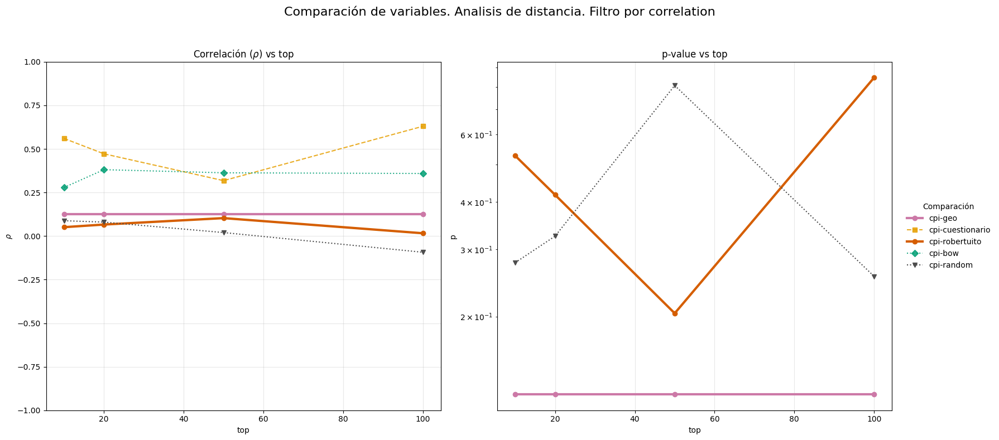

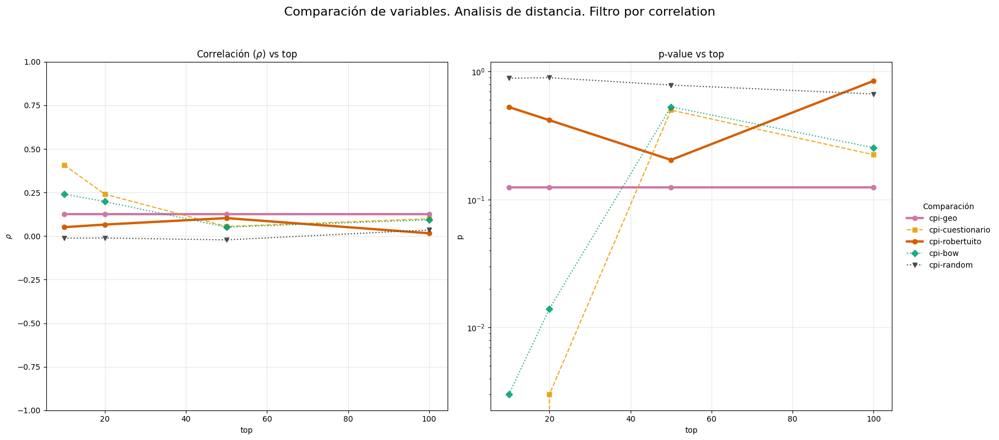

In [17]:
# CON FILTRO DE CORRELACION PREVIO
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'bow': t
}

wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation',
    #seg_feat_dict=
    measure_relation_by='correlation',
    compare_to=df_dict["cpi"][['cpi']],
    #print_progress=True,
    min_features_ratio=20
)
srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation',
    #seg_feat_dict=
    measure_relation_by='distance',
    compare_to=df_dict["cpi"][['cpi']],
    #print_progress=True,
    min_features_ratio=20
)
srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

### Mezclas de filtrados

#### Un filtro

##### Correlacion (final)

Procesando top 10...
  Calculando matrices de características...
		Calculando distancia para cuestionario...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3901 para mantener 27 características.
		Calculando distancia para robertuito...
		Calculando distancia para bow...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 155 características (mínimo deseado: 4999). Ajustando a 0.3506.
  Preparando matrices de correlación...
  Vectorizando matrices de correlación...
  Calculando correlaciones...
  Preparando resultados...
Top 10 resultados:
--------------------------------------------------
        comparacion      r      p  top
0           cpi-geo  0.125  0.125   10
1  cpi-cuestionario  0.395  0.000   10
2    cpi-robertuito  0.051  0.528   10
3           cpi-bow  0.377  0.000   10
4        cpi-random -0.037  0.653   10

Procesando top 20...
  Calculando matrices de características...
		Calculando distancia para cuestionario...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3523 para mantener 54 características.
		Calculando distancia para robertuito...
		Calculando distancia para bow...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 317 características (mínimo deseado: 9999). Ajustando a 0.3506.
  Preparando matrices de correlación...
  Vectorizando matrices de correlación...
  Calculando correlaciones...
  Preparando resultados...
Top 20 resultados:
--------------------------------------------------
        comparacion      r      p  top
0           cpi-geo  0.125  0.125   20
1  cpi-cuestionario  0.436  0.000   20
2    cpi-robertuito  0.066  0.417   20
3           cpi-bow  0.429  0.000   20
4        cpi-random -0.077  0.343   20

Procesando top 50...
  Calculando matrices de características...
		Calculando distancia para cuestionario...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 2 características (mínimo deseado: 135). Ajustando a 0.3817.
		Calculando distancia para robertuito...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


		Calculando distancia para bow...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 1346 características (mínimo deseado: 24997). Ajustando a 0.3834.
  Preparando matrices de correlación...
  Vectorizando matrices de correlación...
  Calculando correlaciones...
  Preparando resultados...
Top 50 resultados:
--------------------------------------------------
        comparacion      r      p  top
0           cpi-geo  0.125  0.125   50
1  cpi-cuestionario  0.462  0.000   50
2    cpi-robertuito  0.103  0.204   50
3           cpi-bow  0.571  0.000   50
4        cpi-random  0.049  0.545   50

Procesando top 100...
  Calculando matrices de características...
		Calculando distancia para cuestionario...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 22 características (mínimo deseado: 270). Ajustando a 0.3922.
		Calculando distancia para robertuito...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


		Calculando distancia para bow...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 4359 características (mínimo deseado: 49995). Ajustando a 0.3974.
  Preparando matrices de correlación...
  Vectorizando matrices de correlación...
  Calculando correlaciones...
  Preparando resultados...
Top 100 resultados:
--------------------------------------------------
        comparacion      r      p  top
0           cpi-geo  0.125  0.125  100
1  cpi-cuestionario  0.487  0.000  100
2    cpi-robertuito  0.016  0.846  100
3           cpi-bow  0.708  0.000  100
4        cpi-random -0.038  0.645  100

Combinando resultados de todos los tops...


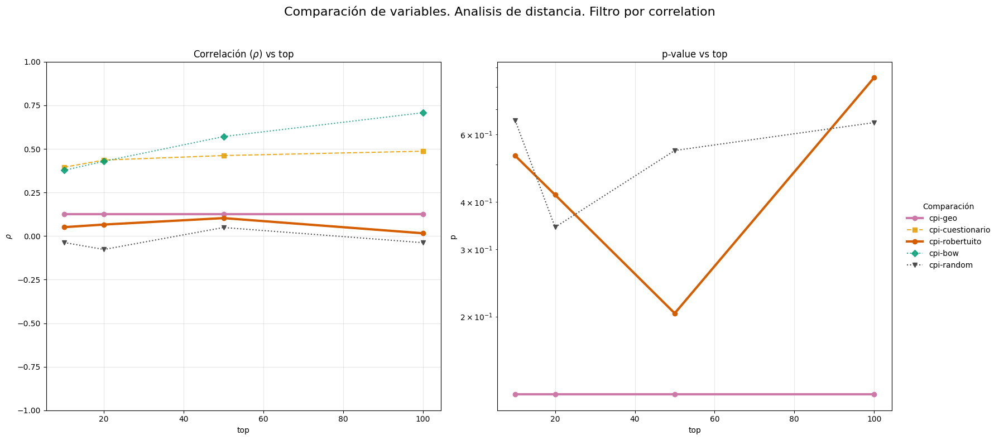

In [12]:
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'bow': t
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation',
    #seg_feat_dict=
    #measure_relation_by='correlation',
    compare_to=df_dict["cpi"][['cpi']],
    print_progress=True,
    min_features_ratio=0.1
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

##### MI sobre dataset completo

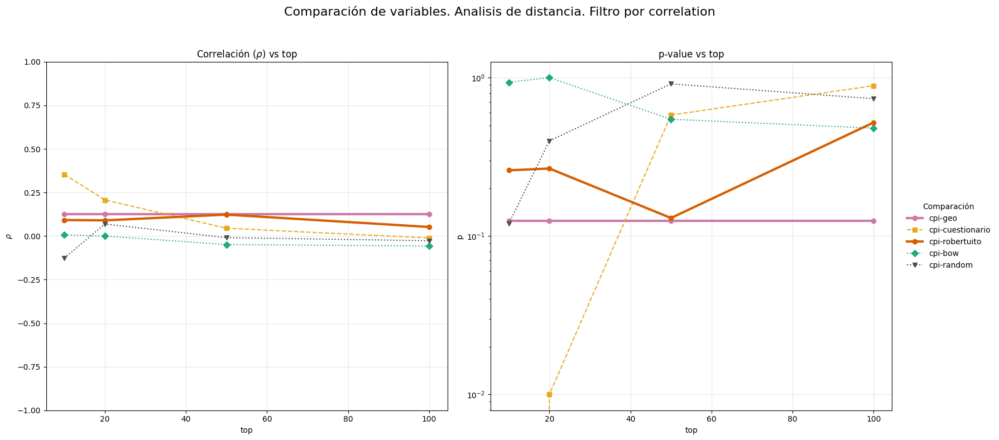

In [25]:
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'bow': t
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='no_filter',
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

#### Dos filtros

##### MI sobre dataset completo + correlacion (final)

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3817 para mantener 10 características.
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.1700 para mantener 10 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3506 para mantener 20 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3024 para mantener 20 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3847 para mantener 50 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3120 para mantener 50 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 9 características (mínimo deseado: 100). Ajustando a 0.4041.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 1 características (mínimo deseado: 100). Ajustando a 0.3552.


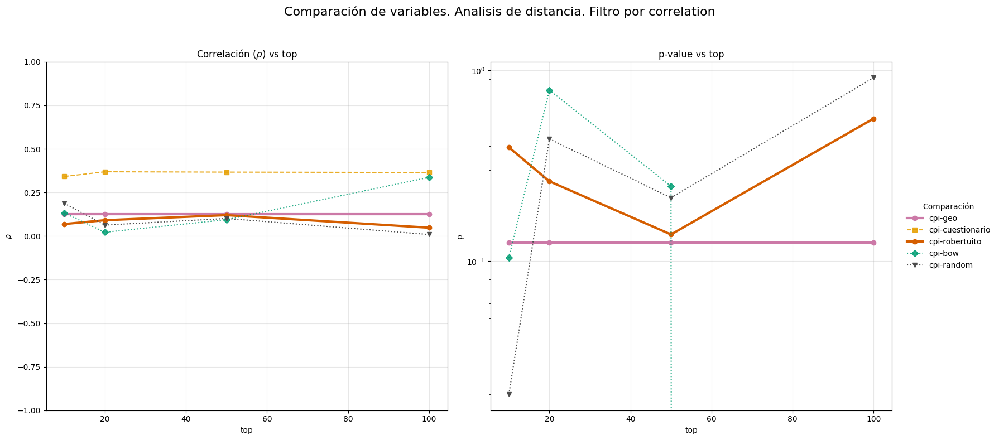

In [26]:
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'bow': t
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation',
    #seg_feat_dict=
    measure_relation_by='correlation',
    compare_to=df_dict["cpi"][['cpi']],
    #print_progress=True,
    min_features_ratio=0.1
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

##### Correlacion + MI sobre dataset completo

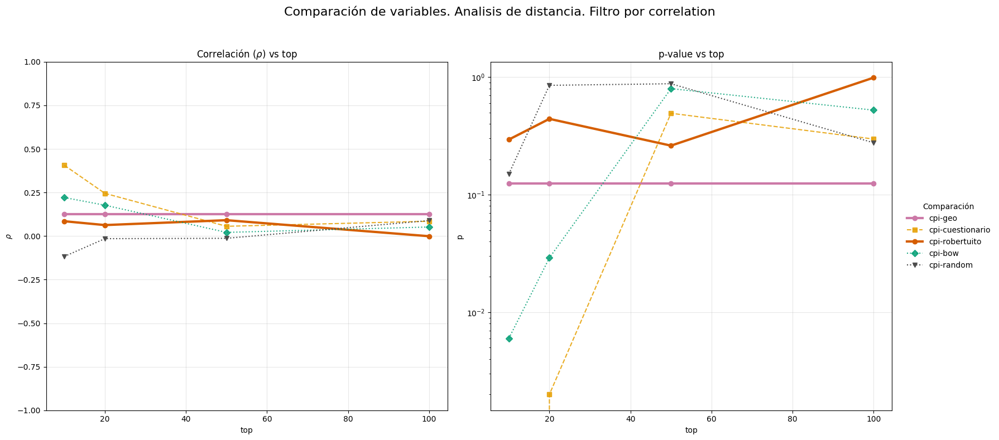

In [31]:
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'bow': t
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='no_filter',
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

Procesando top 10...
  Calculando matrices de características...
		Calculando distancia para cuestionario...
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4487 para mantener 6 características.
		Calculando distancia para robertuito...
		Calculando distancia para bow...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4089 para mantener 6 características.
  Preparando matrices de correlación...
  Vectorizando matrices de correlación...
  Calculando correlaciones...
  Preparando resultados...
Top 10 resultados:
--------------------------------------------------
        comparacion      r      p  top
0           cpi-geo  0.125  0.125   10
1  cpi-cuestionario  0.403  0.000   10
2    cpi-robertuito  0.051  0.528   10
3           cpi-bow  0.409  0.000   10
4        cpi-random -0.101  0.213   10

Procesando top 20...
  Calculando matrices de características...
		Calculando distancia para cuestionario...
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3973 para mantener 12 características.
		Calculando distancia para robertuito...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


		Calculando distancia para bow...
  Preparando matrices de correlación...
  Vectorizando matrices de correlación...
  Calculando correlaciones...
  Preparando resultados...
Top 20 resultados:
--------------------------------------------------
        comparacion      r      p  top
0           cpi-geo  0.125  0.125   20
1  cpi-cuestionario  0.217  0.007   20
2    cpi-robertuito  0.066  0.417   20
3           cpi-bow  0.316  0.000   20
4        cpi-random -0.012  0.886   20

Procesando top 50...
  Calculando matrices de características...
		Calculando distancia para cuestionario...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 1 características (mínimo deseado: 30). Ajustando a 0.3940.
		Calculando distancia para robertuito...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


		Calculando distancia para bow...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 21 características (mínimo deseado: 30). Ajustando a 0.5403.
  Preparando matrices de correlación...
  Vectorizando matrices de correlación...
  Calculando correlaciones...
  Preparando resultados...
Top 50 resultados:
--------------------------------------------------
        comparacion      r      p  top
0           cpi-geo  0.125  0.125   50
1  cpi-cuestionario  0.225  0.005   50
2    cpi-robertuito  0.103  0.204   50
3           cpi-bow  0.628  0.000   50
4        cpi-random  0.061  0.456   50

Procesando top 100...
  Calculando matrices de características...
		Calculando distancia para cuestionario...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 21 características (mínimo deseado: 60). Ajustando a 0.4551.
		Calculando distancia para robertuito...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


		Calculando distancia para bow...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 45 características (mínimo deseado: 60). Ajustando a 0.5639.
  Preparando matrices de correlación...
  Vectorizando matrices de correlación...
  Calculando correlaciones...
  Preparando resultados...
Top 100 resultados:
--------------------------------------------------
        comparacion      r      p  top
0           cpi-geo  0.125  0.125  100
1  cpi-cuestionario  0.605  0.000  100
2    cpi-robertuito  0.016  0.846  100
3           cpi-bow  0.629  0.000  100
4        cpi-random -0.054  0.507  100

Combinando resultados de todos los tops...


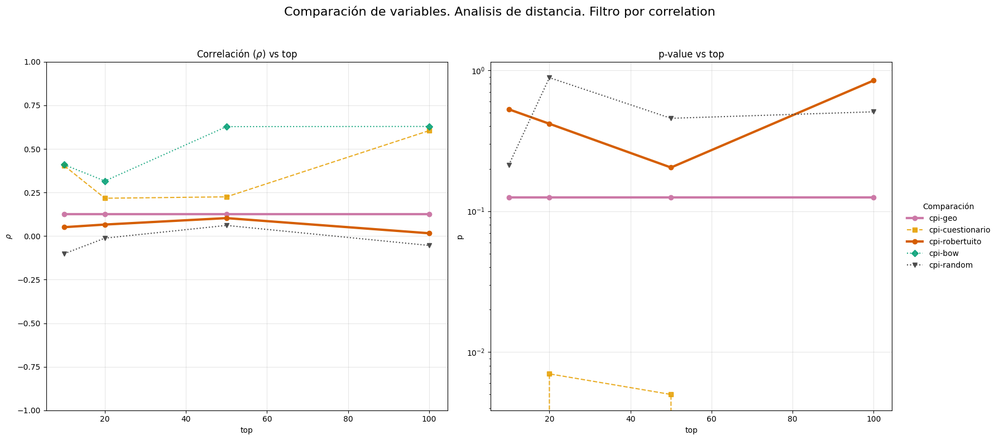

In [18]:
# CON RELACION MEDIDA POR CORRELACION
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'bow': t
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation',
    #seg_feat_dict=
    #measure_relation_by='correlation',
    compare_to=df_dict["cpi"][['cpi']],
    print_progress=True,
    min_features_ratio=0.1
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

#### Tres filtros

##### Correlacion + MI sobre dataset completo + correlacion (final)

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4176 para mantener 6 características.
Advertencia: El threshold 0.6 seleccionó solo 1 características (mínimo deseado: 9). Ajustando a 0.4314.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3974 para mantener 13 características.
Advertencia: El threshold 0.6 seleccionó solo 1 características (mínimo deseado: 19). Ajustando a 0.4297.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3974 para mantener 32 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 3 características (mínimo deseado: 47). Ajustando a 0.4128.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 15 características (mínimo deseado: 65). Ajustando a 0.4270.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 12 características (mínimo deseado: 95). Ajustando a 0.4109.


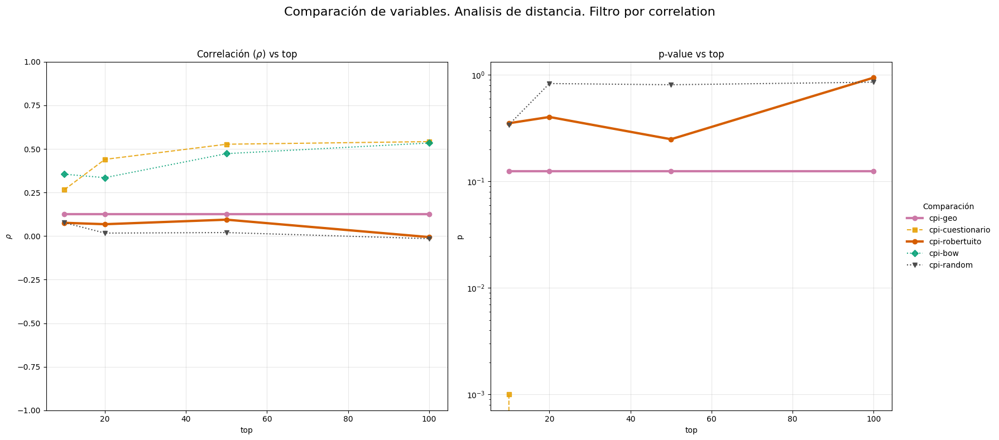

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4487 para mantener 3 características.
Advertencia: El threshold 0.6 seleccionó solo 1 características (mínimo deseado: 4). Ajustando a 0.4978.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4205 para mantener 6 características.
Advertencia: El threshold 0.6 seleccionó solo 1 características (mínimo deseado: 9). Ajustando a 0.4713.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4296 para mantener 16 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 3 características (mínimo deseado: 23). Ajustando a 0.4651.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 15 características (mínimo deseado: 32). Ajustando a 0.5480.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:806: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 12 características (mínimo deseado: 47). Ajustando a 0.4917.


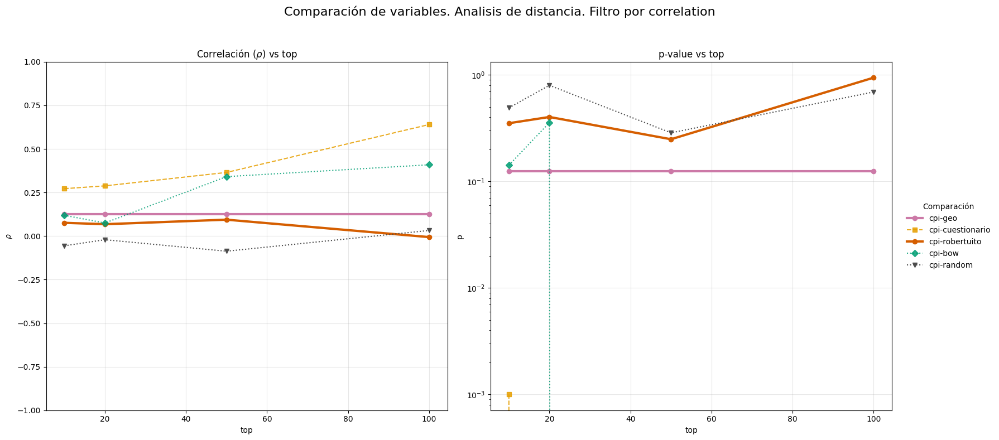

In [32]:
# CON FILTRO DE CORRELACION PREVIO
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'bow': t
}

wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation',
    #seg_feat_dict=
    measure_relation_by='correlation',
    compare_to=df_dict["cpi"][['cpi']],
    #print_progress=True,
    min_features_ratio=0.1
)
srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation',
    #seg_feat_dict=
    measure_relation_by='correlation',
    compare_to=df_dict["cpi"][['cpi']],
    #print_progress=True,
    min_features_ratio=0.05
)
srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

#### Tasa de seleccion + correlacion

### Solo mas relevantes
#### umbral = 0.6

In [129]:
_, wide = srl.compute_rank_feature_distance(df_dict['rankings'][list(range(10))], df_dict['cuestionario'], expanded=True)
relevance = srl.feature_relevance_multitarget(wide, df_dict["cpi"][['cpi']])
relevance

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib_backup.py:769: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


,feature,rh,p,n,p_fdr,target
0,intencion__c_std_s1,0.522422,0.026136,18,NaN,cpi
1,localidad_problema__b_mean_s1,0.504231,0.032860,18,NaN,cpi
2,localidad_problema__b_cum_s1,0.504231,0.032860,18,NaN,cpi
3,intencion__c_mean_s1,0.463086,0.052947,18,NaN,cpi
4,intencion__c_cum_s1,0.463086,0.052947,18,NaN,cpi
...,...,...,...,...,...,...
265,involucrados__h_delta_cum_s1,NaN,NaN,18,NaN,cpi
266,emociones__a_delta_cum_s1,NaN,NaN,18,NaN,cpi
267,emociones__b_delta_cum_s1,NaN,NaN,18,NaN,cpi
268,emociones__c_delta_cum_s1,NaN,NaN,18,NaN,cpi


Procesando top 10...
  Calculando matrices de características...
		Calculando distancia para cuestionario...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3901 para mantener 26 características.
		Calculando distancia para robertuito...
		Calculando distancia para bow...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.2576 para mantener 74 características.
  Preparando matrices de correlación...
  Vectorizando matrices de correlación...
  Calculando correlaciones...
  Preparando resultados...
Top 10 resultados:
--------------------------------------------------
        comparacion      r      p  top
0           cpi-geo  0.125  0.125   10
1  cpi-cuestionario  0.395  0.000   10
2    cpi-robertuito  0.051  0.528   10
3           cpi-bow  0.050  0.536   10
4        cpi-random  0.116  0.153   10

Procesando top 20...
  Calculando matrices de características...
		Calculando distancia para cuestionario...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3523 para mantener 52 características.
		Calculando distancia para robertuito...
		Calculando distancia para bow...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 5 características (mínimo deseado: 149). Ajustando a 0.3420.
  Preparando matrices de correlación...
  Vectorizando matrices de correlación...
  Calculando correlaciones...
  Preparando resultados...
Top 20 resultados:
--------------------------------------------------
        comparacion      r      p  top
0           cpi-geo  0.125  0.125   20
1  cpi-cuestionario  0.436  0.000   20
2    cpi-robertuito  0.066  0.417   20
3           cpi-bow  0.166  0.040   20
4        cpi-random  0.074  0.363   20

Procesando top 50...
  Calculando matrices de características...
		Calculando distancia para cuestionario...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 2 características (mínimo deseado: 130). Ajustando a 0.3817.
		Calculando distancia para robertuito...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


		Calculando distancia para bow...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 14 características (mínimo deseado: 372). Ajustando a 0.3748.
  Preparando matrices de correlación...
  Vectorizando matrices de correlación...
  Calculando correlaciones...
  Preparando resultados...
Top 50 resultados:
--------------------------------------------------
        comparacion      r      p  top
0           cpi-geo  0.125  0.125   50
1  cpi-cuestionario  0.464  0.000   50
2    cpi-robertuito  0.103  0.204   50
3           cpi-bow  0.376  0.000   50
4        cpi-random -0.204  0.011   50

Procesando top 100...
  Calculando matrices de características...
		Calculando distancia para cuestionario...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 22 características (mínimo deseado: 260). Ajustando a 0.3974.
		Calculando distancia para robertuito...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


		Calculando distancia para bow...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 151 características (mínimo deseado: 745). Ajustando a 0.4129.
  Preparando matrices de correlación...
  Vectorizando matrices de correlación...
  Calculando correlaciones...
  Preparando resultados...
Top 100 resultados:
--------------------------------------------------
        comparacion      r      p  top
0           cpi-geo  0.125  0.125  100
1  cpi-cuestionario  0.482  0.000  100
2    cpi-robertuito  0.016  0.846  100
3           cpi-bow  0.471  0.000  100
4        cpi-random  0.106  0.190  100

Combinando resultados de todos los tops...


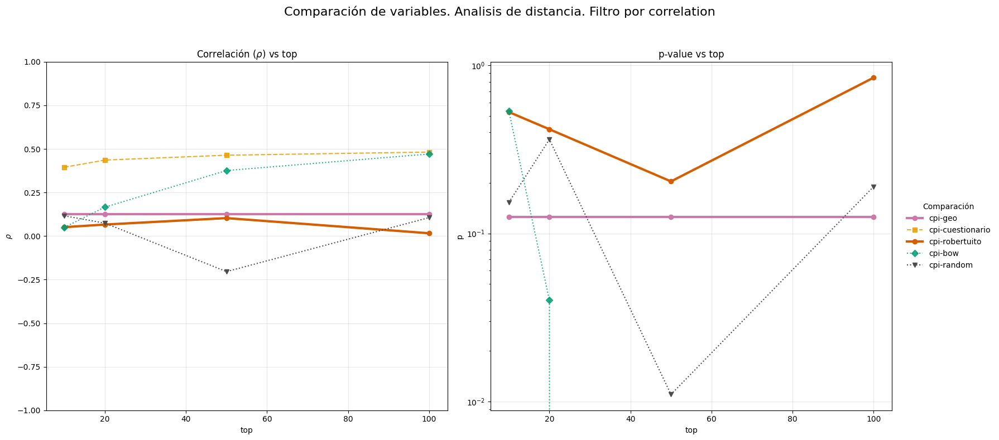

In [42]:
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'bow': t
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation',
    #seg_feat_dict=
    #measure_relation_by='correlation',
    compare_to=df_dict["cpi"][['cpi']],
    print_progress=True,
    min_features_ratio=0.1
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

In [93]:
thres_aux = {
    'cuestionario': 0.5,
    'robertuito': 0,
    'bow': 0.5
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres_aux,
    ignore=ignore, 
    segmentation=segmentation, 
    one_hot_cols=one_hot_cols, 
    expanded=True, 
    filter_by='correlation', 
    compare_to=df_dict["cpi"][['cpi']]
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:748: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:748: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:748: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:748: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:748: ConstantInputWarning: An input array is constant; the correlati

KeyboardInterrupt: 

#### umbral = 0.65

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlati

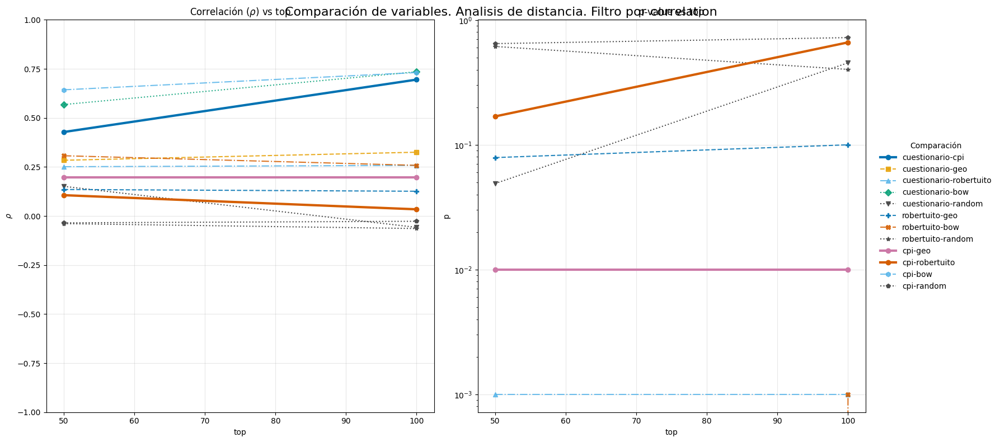

In [ ]:
thres_aux = {
    'cuestionario': 0.65,
    'robertuito': 0,
    'bow': 0.65
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres_aux,
    ignore=ignore, 
    segmentation=segmentation, 
    one_hot_cols=one_hot_cols, 
    expanded=True, 
    filter_by='correlation', 
    compare_to=df_dict["cpi"][['cpi']]
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

#### umbral = 0.72

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


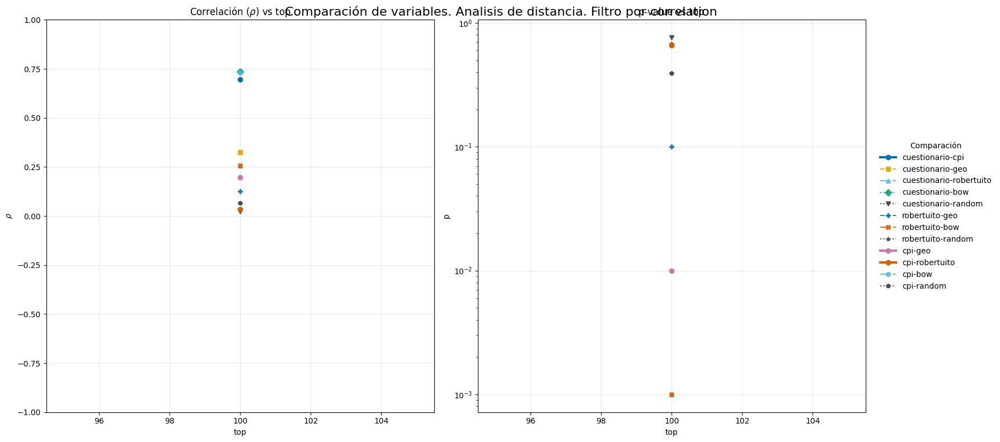

In [ ]:
thres_aux = {
    'cuestionario': 0.72,
    'robertuito': 0,
    'bow': 0.72
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres_aux,
    ignore=ignore, 
    segmentation=segmentation, 
    one_hot_cols=one_hot_cols, 
    expanded=True, 
    filter_by='correlation', 
    compare_to=df_dict["cpi"][['cpi']]
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

### Solo con buena informacion mutua

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlati

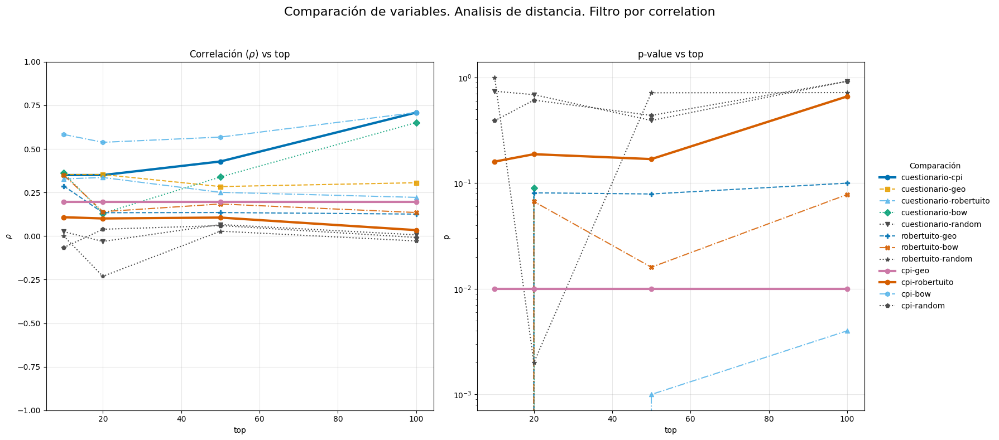

In [48]:
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation, 
    one_hot_cols=one_hot_cols, 
    expanded=True, 
    filter_by='correlation', 
    compare_to=df_dict["cpi"][['cpi']]
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlati

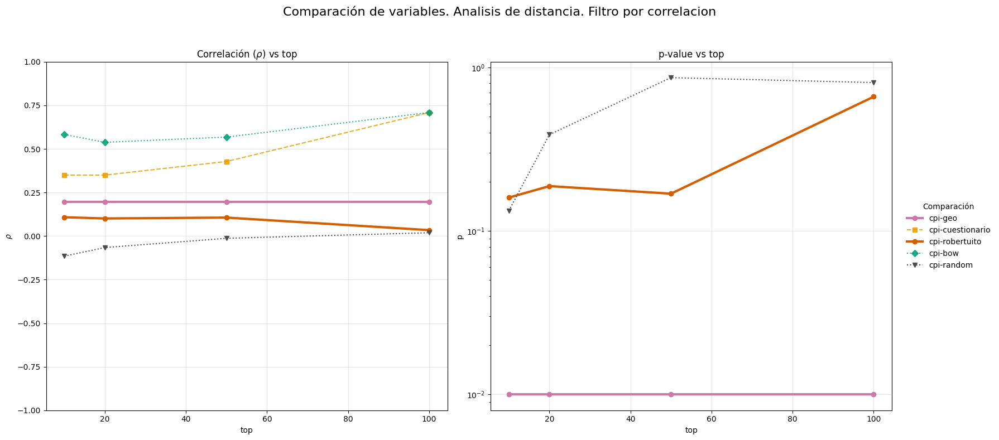

In [ ]:
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation', 
    compare_to=df_dict["cpi"][['cpi']]
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlacion", 
    highlight_palette=HIGHLIGHT_COLORS
)

#### Sin resultados comunes

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlati

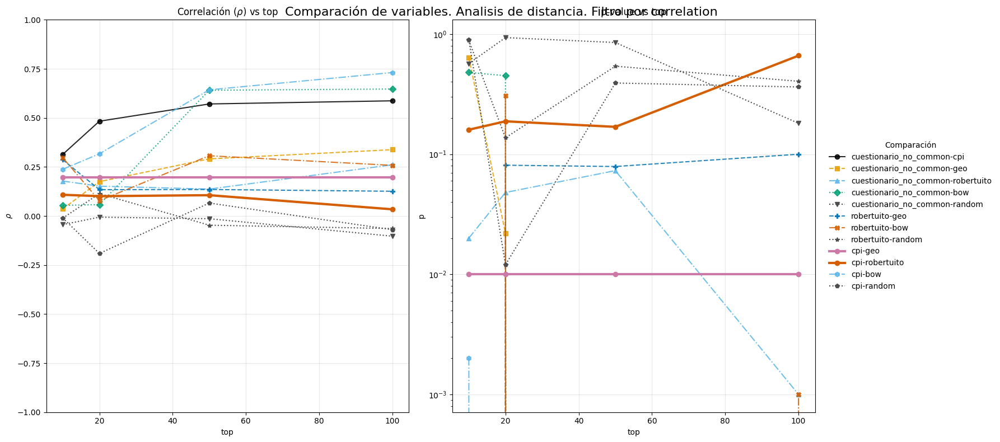

In [24]:
thres_no_common = {
    'cuestionario_no_common': 0.5,
    'robertuito': 0,
    'bow': 0.6
}

wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres_no_common.keys(),
    thres_dict=thres_no_common,
    ignore=ignore_no_common, 
    segmentation=segmentation, 
    one_hot_cols=one_hot_cols, 
    expanded=True, 
    filter_by='correlation', 
    compare_to=df_dict["cpi"][['cpi']],
    suffix='_no_common'
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

#### Ponderado
##### Inversa de log de rango

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:747: ConstantInputWarning: An input array is constant; the correlati

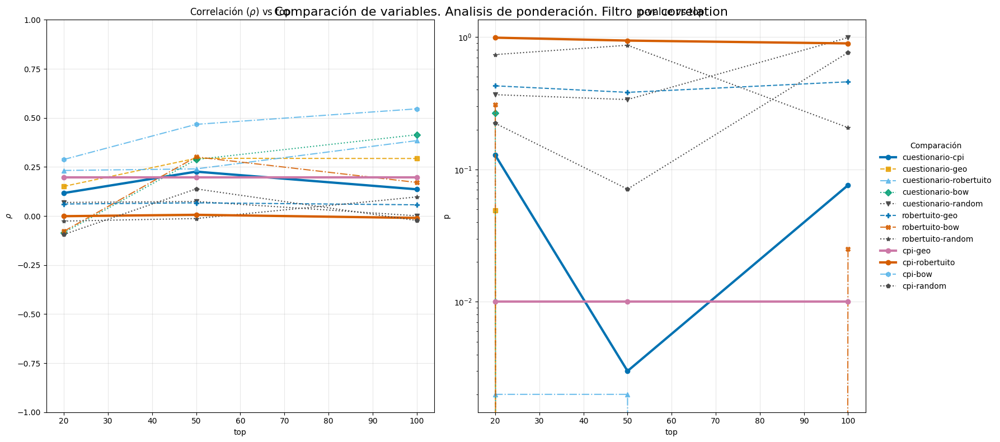

In [ ]:
thres = {
    'cuestionario': 0.3,
    'robertuito': 0,
    'bow': 0.6
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops[1:], 
    corr_dict, 
    analysis_func='ponderate',
    keys=thres.keys(),
    thres_dict=thres,
    start=11,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation', 
    compare_to=df_dict["cpi"][['cpi']]
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "ponderación", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

##### Mismo peso

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib_backup.py:769: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib_backup.py:769: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib_backup.py:769: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib_backup.py:769: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib_bac

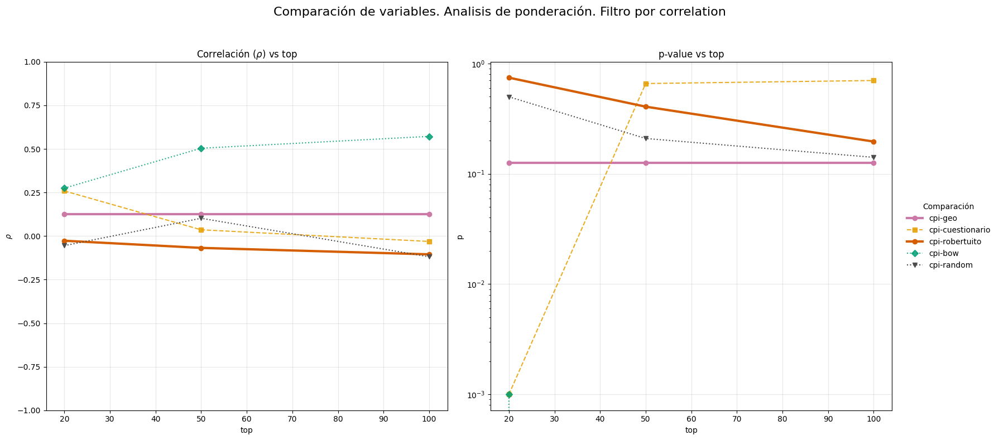

In [131]:
segmentation = 10

thres = {
    'cuestionario': 0.3,
    'robertuito': 0,
    'bow': 0.6
}

def uniform(x):
    return 1.0

wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops[1:], 
    corr_dict, 
    analysis_func='ponderate',
    weight_func=uniform,
    keys=thres.keys(),
    thres_dict=thres,
    start=11,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation', 
    compare_to=df_dict["cpi"][['cpi']]
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "ponderación", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

#### Top caracteristicas por segmento

##### Top 5

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3447 para mantener 5 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3091 para mantener 5 características.
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4041 para mantener 12 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.2532 para mantener 12 características.
Advertencia: El threshold 0.6 seleccionó solo 12 características (mínimo deseado: 25). Ajustando a 0.5063.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 16 características (mínimo deseado: 25). Ajustando a 0.5223.


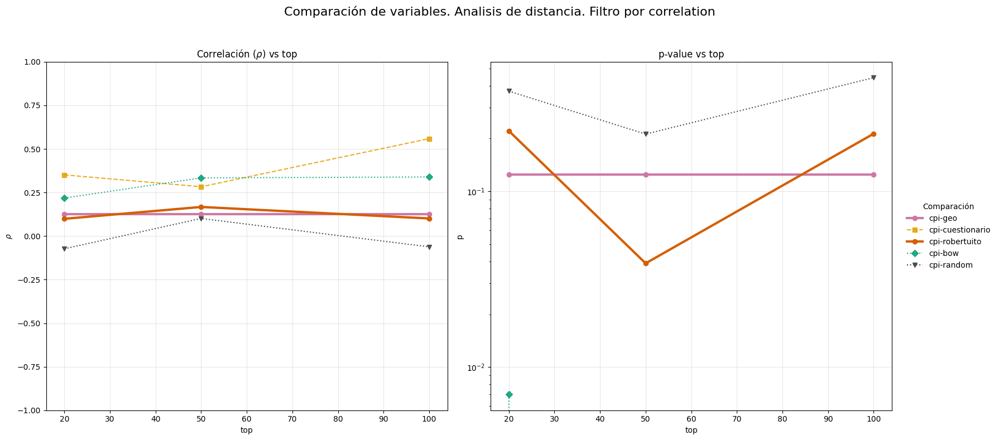

In [35]:
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'bow': t
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops[1:], 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True,
    filter_by='correlation',
    seg_feat_dicts=seg_feat_dict,
    #measure_relation_by='correlation',
    compare_to=df_dict["cpi"][['cpi']],
    print_progress=False
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


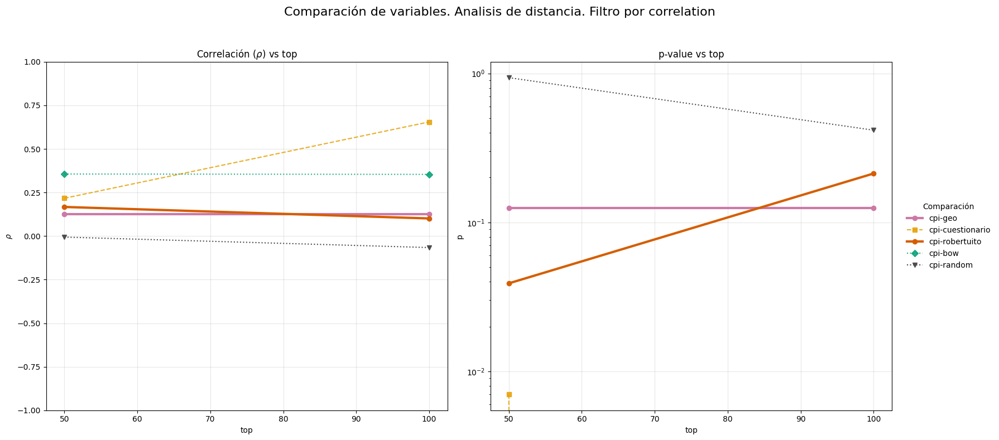

In [69]:
# PRIMER FILTRADO POR CORRELACION Y MI
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'bow': t
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops[2:], 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True,
    filter_by='correlation',
    seg_feat_dicts=seg_feat_dict,
    #measure_relation_by='correlation',
    compare_to=df_dict["cpi"][['cpi']],
    print_progress=False
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

##### Top 10

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3817 para mantener 10 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.2385 para mantener 10 características.
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4041 para mantener 25 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.2385 para mantener 25 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 16 características (mínimo deseado: 50). Ajustando a 0.4841.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 31 características (mínimo deseado: 50). Ajustando a 0.5263.


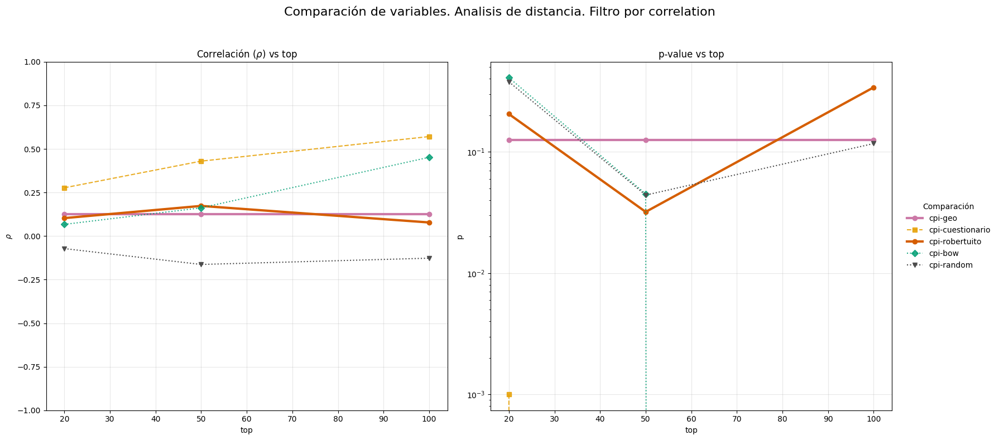

In [45]:
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'bow': t
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops[1:], 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True,
    filter_by='correlation',
    seg_feat_dicts=seg_feat_dict,
    #measure_relation_by='correlation',
    compare_to=df_dict["cpi"][['cpi']],
    print_progress=False
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


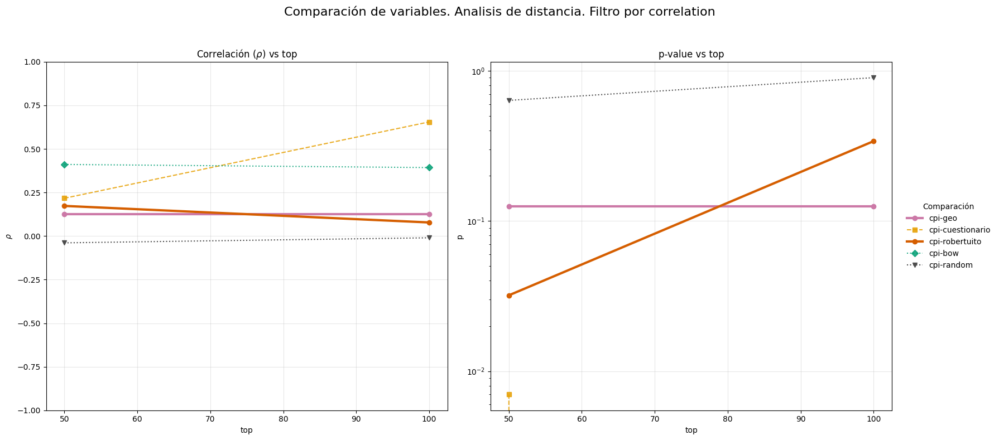

In [63]:
# PRIMER FILTRADO POR CORRELACION Y MI
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'bow': t
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops[2:], 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True,
    filter_by='correlation',
    seg_feat_dicts=seg_feat_dict,
    #measure_relation_by='correlation',
    compare_to=df_dict["cpi"][['cpi']],
    print_progress=False
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

##### Top 20

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3506 para mantener 20 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 4 características (mínimo deseado: 20). Ajustando a 0.2571.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 2 características (mínimo deseado: 50). Ajustando a 0.4035.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 7 características (mínimo deseado: 50). Ajustando a 0.3358.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 20 características (mínimo deseado: 100). Ajustando a 0.4487.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 97 características (mínimo deseado: 100). Ajustando a 0.5899.


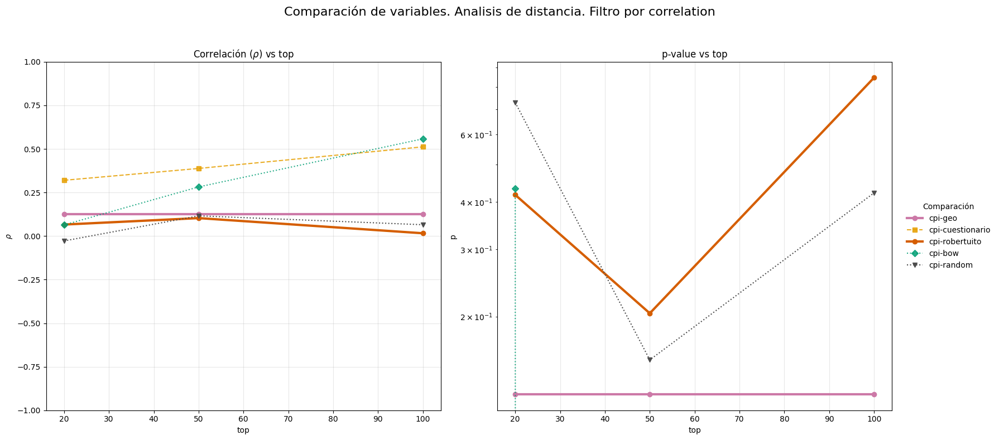

In [51]:
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'bow': t
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops[1:], 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True,
    filter_by='correlation',
    seg_feat_dicts=seg_feat_dict,
    #measure_relation_by='correlation',
    compare_to=df_dict["cpi"][['cpi']],
    print_progress=False
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:790: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


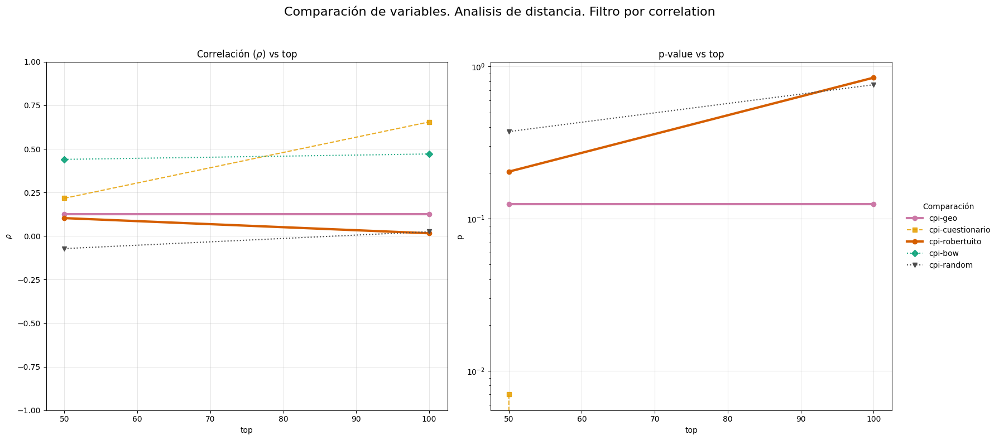

In [ ]:
# PRIMER FILTRADO POR CORRELACION Y MI
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'bow': t
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops[2:], 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True,
    filter_by='correlation',
    seg_feat_dicts=seg_feat_dict,
    #measure_relation_by='correlation',
    compare_to=df_dict["cpi"][['cpi']],
    print_progress=False
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

#### Preguntas mas relevantes

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:754: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:754: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:754: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:754: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:754: ConstantInputWarning: An input array is constant; the correlati

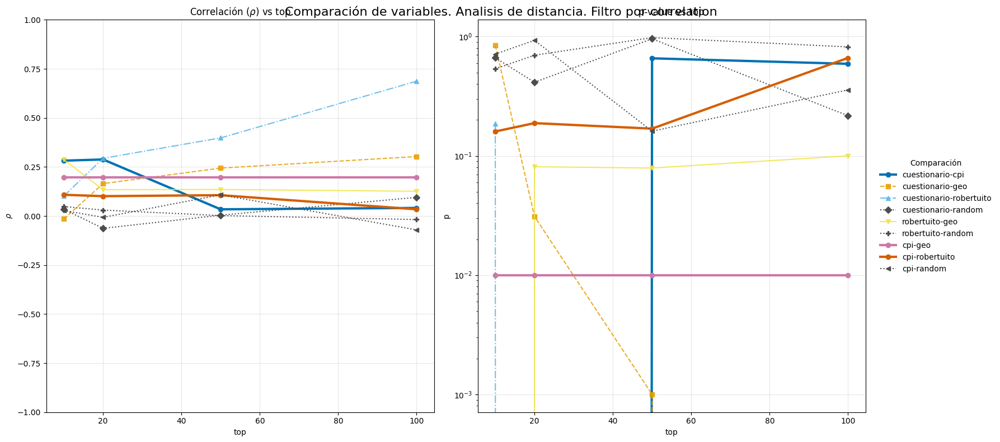

In [ ]:
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation, 
    one_hot_cols=one_hot_cols, 
    expanded=True, 
    filter_by='question', 
    compare_to=df_dict["cpi"][['cpi']]
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    "correlation", 
    highlight_palette=HIGHLIGHT_COLORS
)

#### Top k incisos de preguntas mas relevantes
##### k = 1

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:754: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:754: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:754: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:754: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:754: ConstantInputWarning: An input array is constant; the correlati

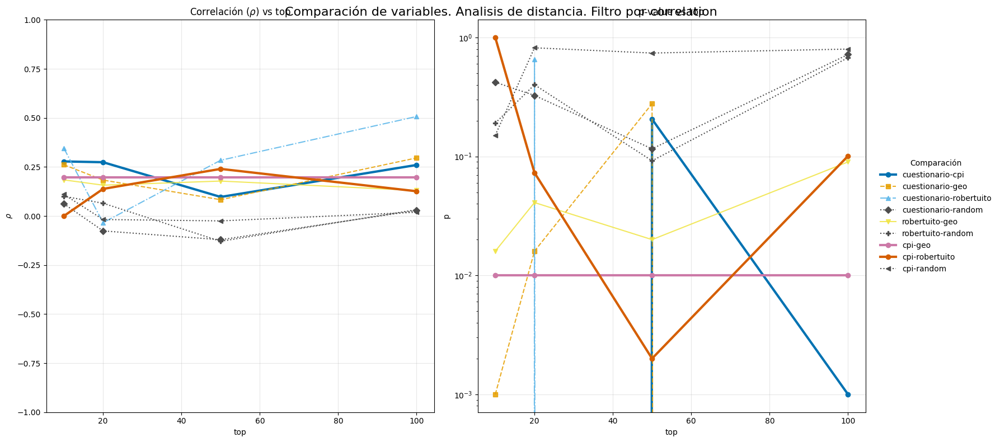

In [ ]:
filter_by = 'top_k_options'
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation, 
    one_hot_cols=one_hot_cols, 
    expanded=True, 
    filter_by=filter_by, 
    k=1,
    compare_to=df_dict["cpi"][['cpi']]
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    filter_by, 
    highlight_palette=HIGHLIGHT_COLORS
)

##### k = 2

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:754: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:754: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:754: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:754: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:754: ConstantInputWarning: An input array is constant; the correlati

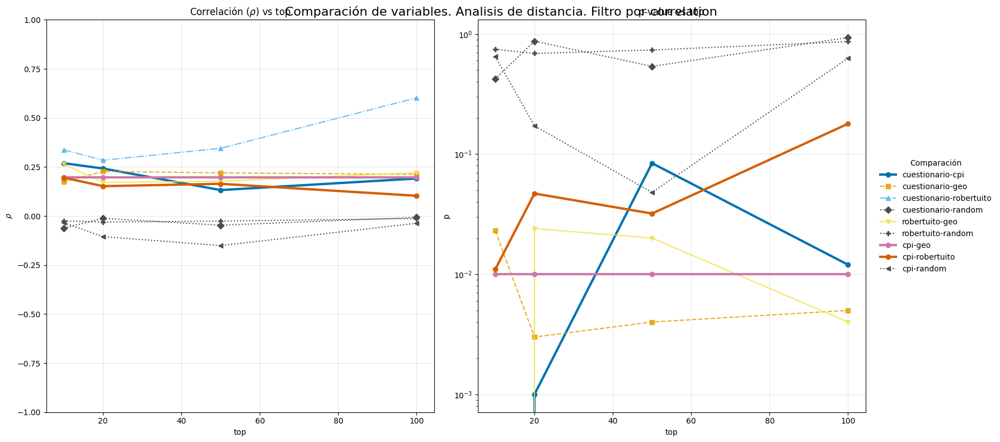

In [ ]:
filter_by = 'top_k_options'
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation, 
    one_hot_cols=one_hot_cols, 
    expanded=True, 
    filter_by=filter_by, 
    k=2,
    compare_to=df_dict["cpi"][['cpi']]
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    filter_by, 
    highlight_palette=HIGHLIGHT_COLORS
)

##### k = 3

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:754: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:754: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:754: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:754: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:754: ConstantInputWarning: An input array is constant; the correlati

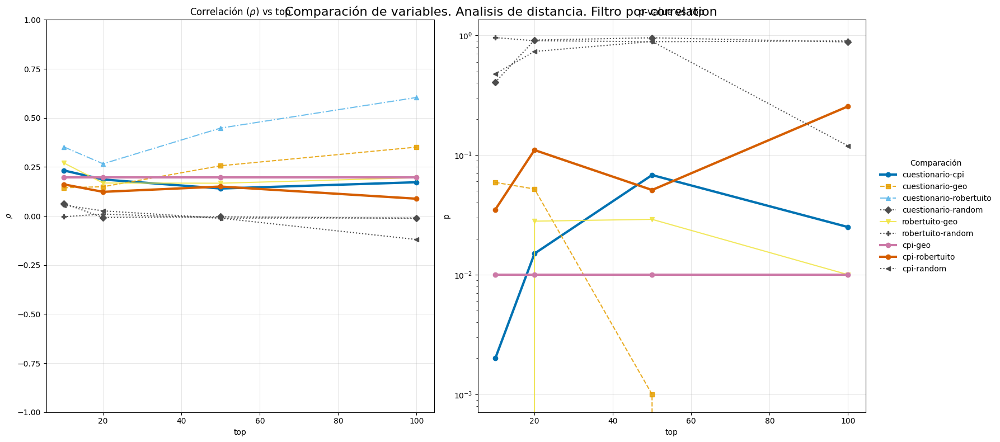

In [ ]:
filter_by = 'top_k_options'
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation, 
    one_hot_cols=one_hot_cols, 
    expanded=True, 
    filter_by=filter_by, 
    k=3,
    compare_to=df_dict["cpi"][['cpi']]
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    filter_by, 
    highlight_palette=HIGHLIGHT_COLORS
)

#### Top k por estadistico
##### k = 1

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:748: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:748: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:748: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:748: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:748: ConstantInputWarning: An input array is constant; the correlati

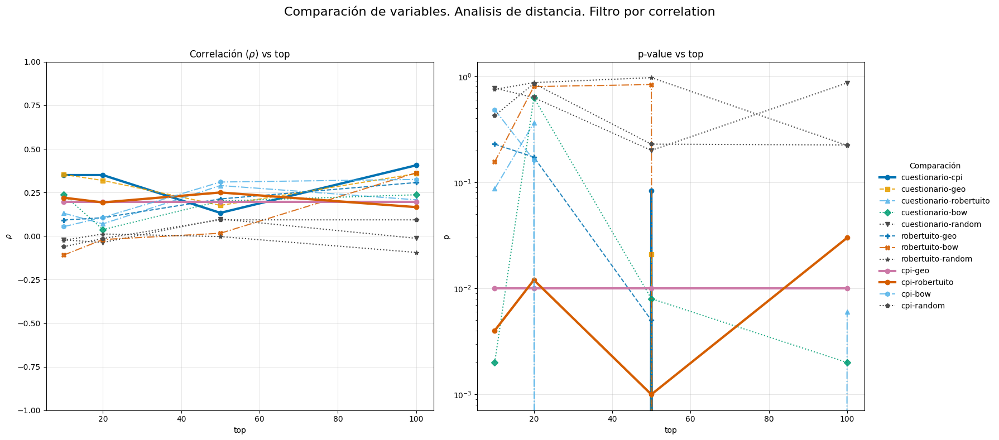

In [ ]:
filter_by = 'top_k_by_statistic'
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by=filter_by, 
    k=1,
    compare_to=df_dict["cpi"][['cpi']]
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    filter_by, 
    highlight_palette=HIGHLIGHT_COLORS
)

##### k = 2

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:748: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:748: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:748: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:748: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:748: ConstantInputWarning: An input array is constant; the correlati

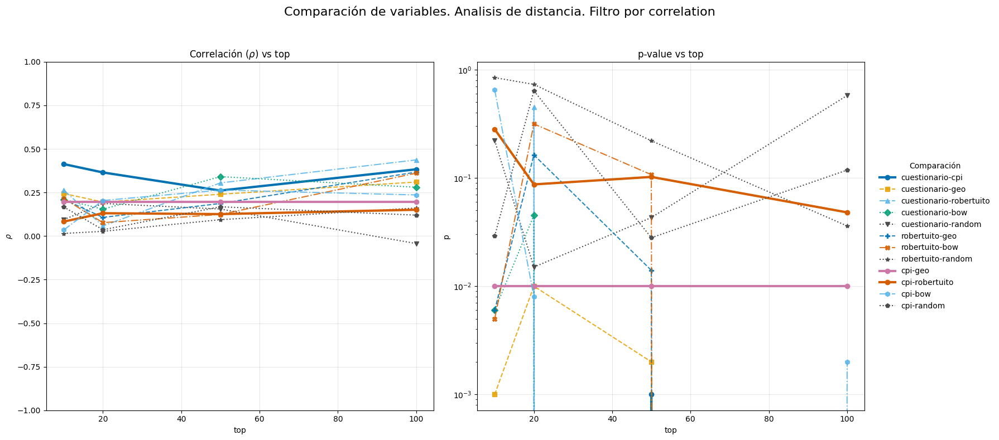

In [ ]:
filter_by = 'top_k_by_statistic'
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by=filter_by, 
    k=3,
    compare_to=df_dict["cpi"][['cpi']]
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    filter_by, 
    highlight_palette=HIGHLIGHT_COLORS
)

##### k = 3

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:748: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:748: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:748: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:748: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:748: ConstantInputWarning: An input array is constant; the correlati

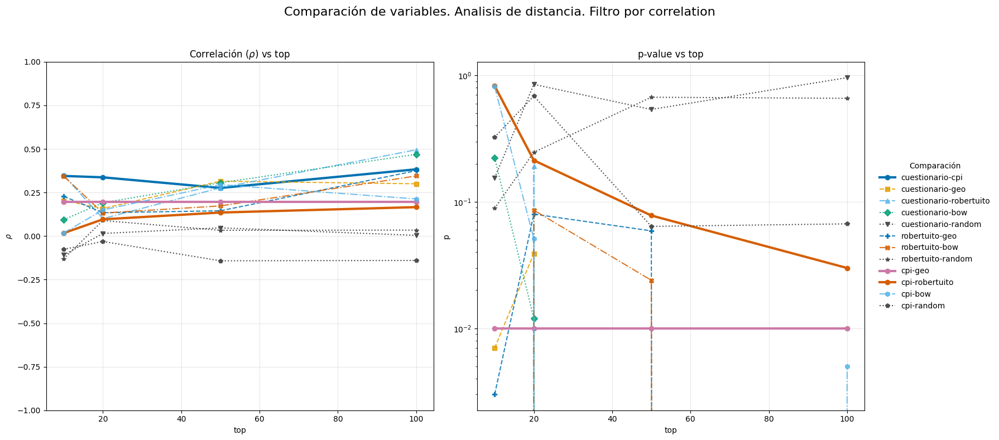

In [16]:
filter_by = 'top_k_by_statistic'
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by=filter_by, 
    k=3,
    compare_to=df_dict["cpi"][['cpi']]
)

srl.graph_comparison(
    wide_r, 
    wide_p, 
    "distancia", 
    filter_by, 
    highlight_palette=HIGHLIGHT_COLORS
)

#### Estadisticos por separado

Filtrando por all...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlati

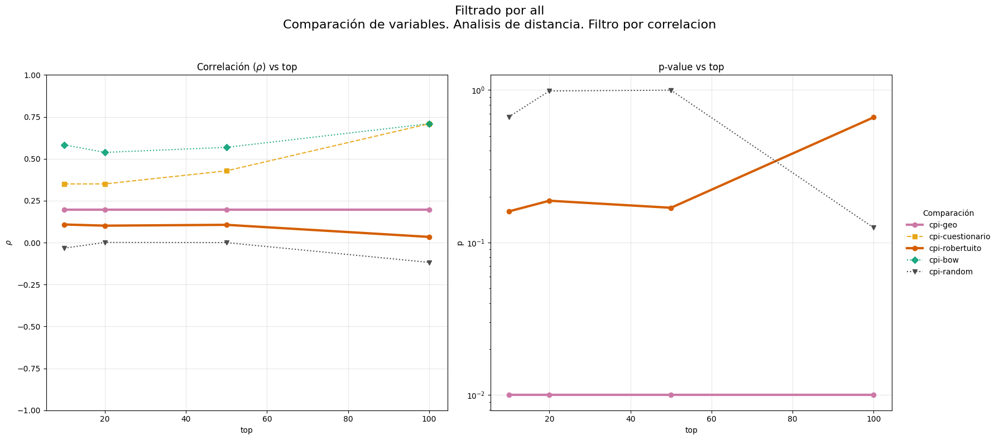

Filtrando por ['mean']...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


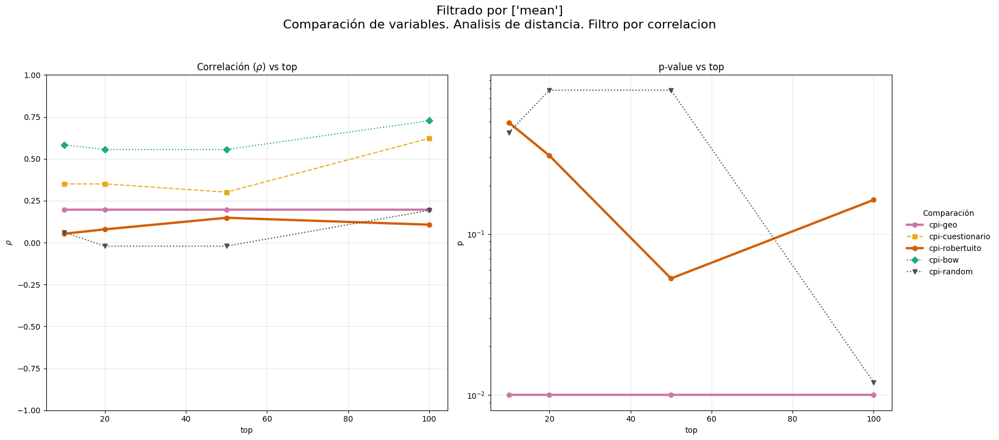

Filtrando por ['std']...
Error al filtrar por ['std']: Found array with 0 feature(s) (shape=(19, 0)) while a minimum of 1 is required by StandardScaler.
Filtrando por ['cum']...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlati

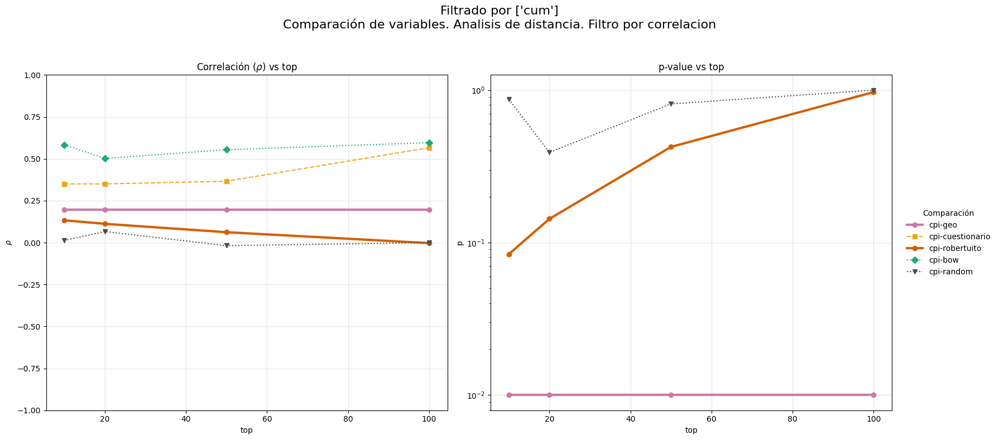

Filtrando por ['diff']...
Error al filtrar por ['diff']: Found array with 0 feature(s) (shape=(19, 0)) while a minimum of 1 is required by StandardScaler.
Filtrando por ['delta_cum']...
Error al filtrar por ['delta_cum']: Found array with 0 feature(s) (shape=(19, 0)) while a minimum of 1 is required by StandardScaler.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/search_results_lib.py:762: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


In [26]:
for stat in ['all', ['mean'], ['std'], ['cum'], ['diff'], ['delta_cum']]:
    print(f"Filtrando por {stat}...")
    try:
        wide_r, wide_p = srl.compare_research_variables(
            df_dict, 
            tops, 
            corr_dict, 
            analysis_func='distance',
            keys=thres.keys(),
            thres_dict=thres,
            ignore=ignore, 
            segmentation=segmentation, 
            take_statistics=stat,
            expanded=True, 
            filter_by='correlation', 
            compare_to=df_dict["cpi"][['cpi']]
        )

        srl.graph_comparison(
            wide_r, 
            wide_p, 
            "distancia", 
            "correlacion", 
            extra_info=f"Filtrado por {stat}",
            highlight_palette=HIGHLIGHT_COLORS
        )
    except Exception as e:
        print(f"Error al filtrar por {stat}: {e}")

### Grupos semanticos

In [45]:
'''t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'bow': t
}
wide_r, wide_p = srl.compare_research_variables(
    df_dict, 
    tops, 
    corr_dict, 
    analysis_func='distance',
    keys=thres.keys(),
    thres_dict=thres,
    ignore=ignore, 
    segmentation=segmentation,
    expanded=True, 
    filter_by='correlation',
    #seg_feat_dict=
    #measure_relation_by='correlation',
    compare_to=df_dict["cpi"][['cpi']],
    #print_progress=True,
    min_features_ratio=20
)
'''
_, wide = srl.compute_rank_feature_distance(
    df_dict['rankings'],
    df_dict['bow'],
    expanded=True,
    threshold=0.6,
    by='correlation',
    compare_to=df_dict["cpi"][['cpi']],
    min_features_ratio=20,
    )

import re
feats = wide.columns
feats_clean = set([re.sub(r"_(?:mean|std|cum|diff|delta_cum)_s\d+$", "", item) for item in feats])
feats_clean

/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


{'gerencia',
 'grecia',
 'escasos',
 'encuentren',
 'situacion patrimonial',
 'corrupcion tipo',
 'this',
 'tal efecto',
 'traduce',
 '4 6',
 'caparros',
 'retribucion',
 'referidos',
 'ciencias sociales',
 'sudan sur',
 'deriva',
 'tomar',
 'si puede',
 '66',
 'demanda',
 'hara',
 'project',
 'partidista',
 'provienen',
 'https doi',
 'hacerse',
 'realice',
 'familia',
 'errores',
 'third',
 'edad',
 'costa',
 'expedientes',
 'senalan',
 'asa',
 'actor',
 'facultades',
 'acceso servicios',
 '1999',
 'denuncias corrupcion',
 'comparar',
 'conjunto',
 'positivas',
 'cantidades',
 'consultar',
 'promedio',
 'pue',
 'direcciones',
 'servidora',
 'sugieren',
 'pgr',
 'capaces',
 'excepcion',
 'grand',
 'civiles',
 'objetiva',
 'vender',
 'nombre',
 'beneficiar',
 'adquiridos',
 'facilmente',
 'politicas corrupcion',
 'relativos',
 'skip',
 'transferencias',
 '21',
 'publicas',
 'partidos',
 'violar',
 'transcript',
 'design',
 'partnership',
 'cuya',
 'tirant',
 'lituania',
 'maduro',
 'ex

In [80]:
forms_groups_dict

{'emocional_valorativo': ['emociones__b', 'emociones__e'],
 'institucional': ['involucrados__b'],
 'delitos_practicas_corruptas': [],
 'participacion_transparencia': ['intencion__c',
  'consecuencias__a',
  'consecuencias__b'],
 'actores_entidades': ['involucrados__c',
  'involucrados__g',
  'tipo_entidad__c'],
 'ruido': []}

In [92]:
with open('../datos/clasificacion_terminos.json', 'r') as f:
    bow_groups_dict = json.load(f)
bow_groups_dict['institucional'] = bow_groups_dict['institucional'] + bow_groups_dict['politico_electoral']
bow_groups_dict.pop('politico_electoral')

['partidista',
 'partidos',
 'decisiones politicas',
 'voto',
 'politicas publicas',
 'actividad politica',
 'legislativas',
 'parlamento',
 'presidente republica',
 'legislador',
 'campanas politicas',
 'politicos',
 'elecciones',
 'social politico',
 'vida politica',
 'poder legislativo',
 'politica cookies',
 'electos',
 'cultura politica',
 'expresidente',
 'partidos politicos',
 'politicas nacionales',
 'senado',
 'president',
 'ex presidente',
 'political',
 'implementacion politicas',
 'gobernantes',
 'politicas',
 'seleccionados',
 'formulacion politicas']

In [96]:
bow_groups_dict['delitos_practicas_corruptas']

['corrupcion tipo',
 'denuncias corrupcion',
 'politicas corrupcion',
 'denuncia corrupcion',
 'corrupcion ejercicio',
 'historia corrupcion',
 'fenomeno corrupcion',
 'fraudulentas',
 'corrupcion existe',
 'corrupcion sociedad',
 'delincuente',
 'flagelo corrupcion',
 'niveles corrupcion',
 'materia anticorrupcion',
 'lavado activos',
 'political corruption',
 'considera corrupcion',
 'indicadores corrupcion',
 'investigacion corrupcion',
 'publico corrupcion',
 'abuso funciones',
 'funcionarios corruptos',
 'practicas corruptas',
 'controlar corrupcion',
 'pago soborno',
 'corrupcion gran',
 'efectos corrupcion',
 'percepcia3n corrupcia3n',
 'publica corrupcion',
 'actos corruptos',
 'causas corrupcion',
 'corrupcion democracia',
 'indice corrupcion',
 'corrupcion causas',
 'escandalo corrupcion',
 'fraud',
 'enfrentar corrupcion',
 'corrupcion manera',
 'corrupcion dentro',
 'corruptos',
 'corrupcion puede',
 'delincuencia',
 'hechos corrupcion',
 'corrupcion corrupcion',
 'medir co

Analizando grupo emocional_valorativo...
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4035 para mantener 1 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 5 características (mínimo deseado: 8). Ajustando a 0.5050.
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4035 para mantener 2 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 9 características (mínimo deseado: 17). Ajustando a 0.4757.
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3567 para mantener 5 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 12 características (mínimo deseado: 42). Ajustando a 0.4400.
Advertencia: El threshold 0.6 seleccionó solo 8 características (mínimo deseado: 10). Ajustando a 0.5480.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 40 características (mínimo deseado: 85). Ajustando a 0.5108.


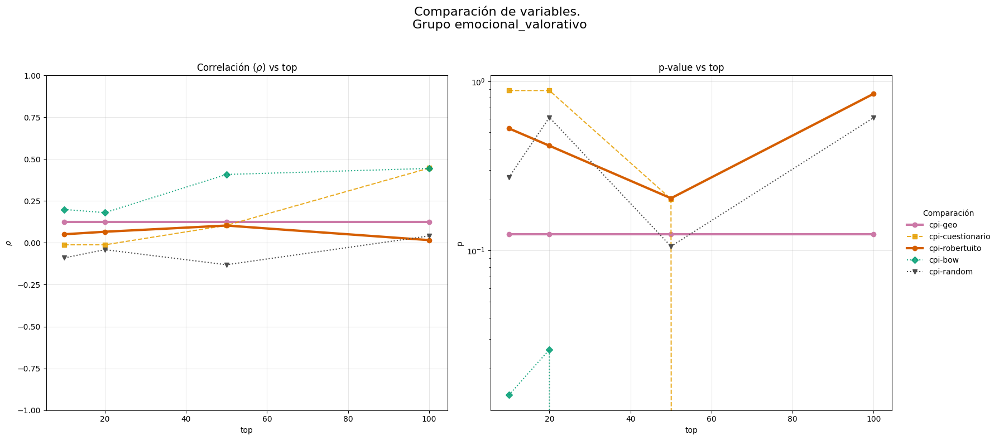

Analizando grupo institucional...
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.5790 para mantener 1 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 8 características (mínimo deseado: 25). Ajustando a 0.3643.
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.5790 para mantener 1 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 8 características (mínimo deseado: 50). Ajustando a 0.3911.
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.5790 para mantener 2 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 41 características (mínimo deseado: 125). Ajustando a 0.4595.
Advertencia: El threshold 0.6 seleccionó solo 3 características (mínimo deseado: 5). Ajustando a 0.5790.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 93 características (mínimo deseado: 250). Ajustando a 0.4901.


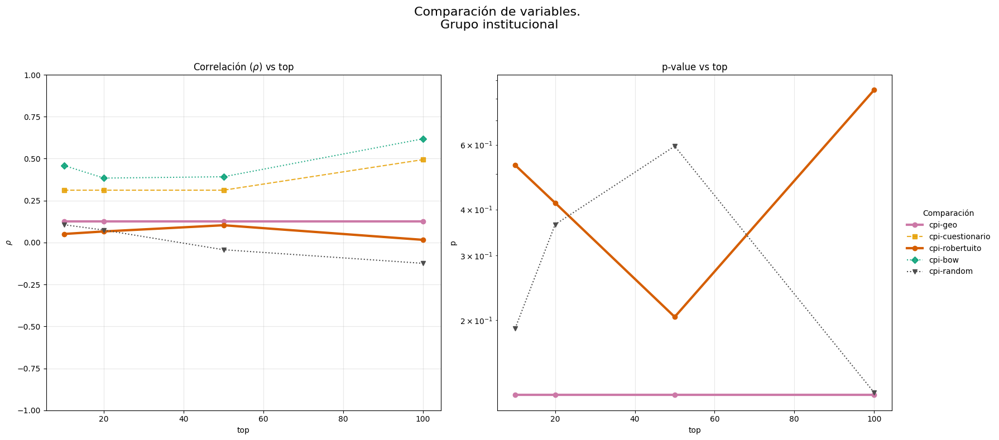

Analizando grupo delitos_practicas_corruptas...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 7 características (mínimo deseado: 67). Ajustando a 0.3506.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 16 características (mínimo deseado: 134). Ajustando a 0.3786.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 92 características (mínimo deseado: 335). Ajustando a 0.4581.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 278 características (mínimo deseado: 670). Ajustando a 0.4953.


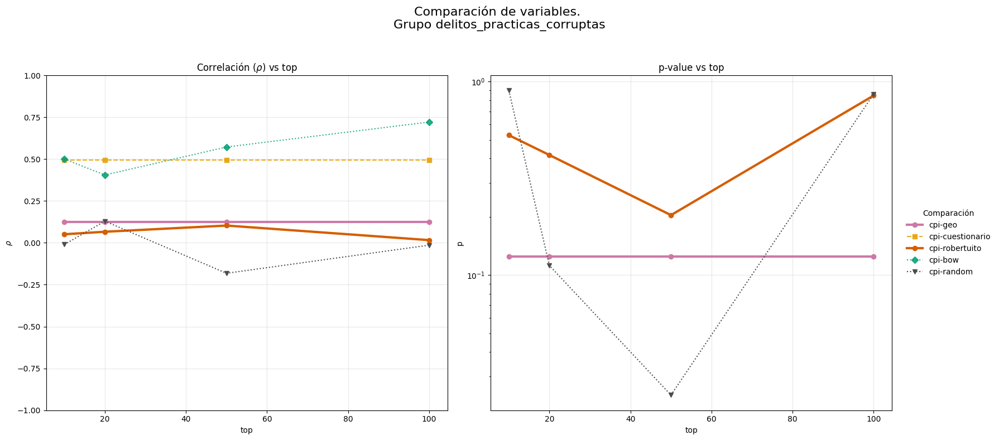

Analizando grupo participacion_transparencia...
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.5224 para mantener 1 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 3 características (mínimo deseado: 18). Ajustando a 0.3779.
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4631 para mantener 3 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 9 características (mínimo deseado: 36). Ajustando a 0.3974.
Advertencia: El threshold 0.6 seleccionó solo 1 características (mínimo deseado: 7). Ajustando a 0.4631.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 31 características (mínimo deseado: 90). Ajustando a 0.4584.
Advertencia: El threshold 0.6 seleccionó solo 4 características (mínimo deseado: 15). Ajustando a 0.4510.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 71 características (mínimo deseado: 180). Ajustando a 0.4654.


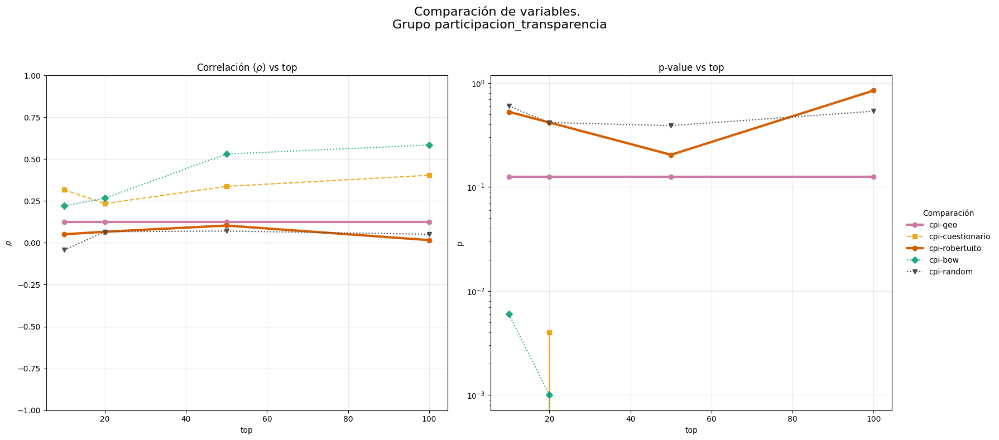

Analizando grupo actores_entidades...
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4487 para mantener 1 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 5 características (mínimo deseado: 18). Ajustando a 0.3789.
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.3406 para mantener 3 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 6 características (mínimo deseado: 36). Ajustando a 0.3709.
Advertencia: El threshold 0.6 seleccionó solo 1 características (mínimo deseado: 7). Ajustando a 0.4176.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 24 características (mínimo deseado: 90). Ajustando a 0.4776.
Advertencia: El threshold 0.6 seleccionó solo 7 características (mínimo deseado: 15). Ajustando a 0.4506.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 80 características (mínimo deseado: 180). Ajustando a 0.4935.


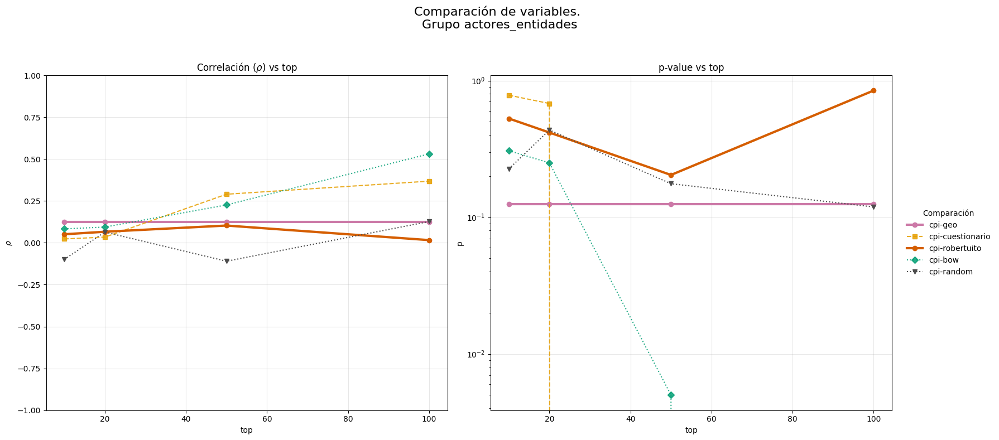

Analizando grupo ruido...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 127 características (mínimo deseado: 849). Ajustando a 0.3659.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 269 características (mínimo deseado: 1698). Ajustando a 0.3946.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 1146 características (mínimo deseado: 4245). Ajustando a 0.4454.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 seleccionó solo 3797 características (mínimo deseado: 8490). Ajustando a 0.4923.


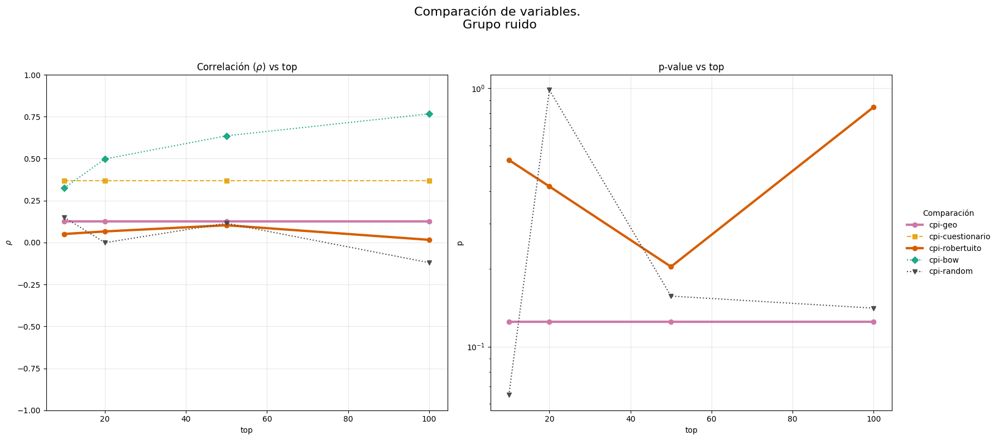

In [83]:
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'bow': t
}

forms_groups_dict = {'emocional_valorativo': ['emociones__b', 'emociones__e'],
    'institucional': ['involucrados__b'],
    'delitos_practicas_corruptas': [],
    'participacion_transparencia': ['intencion__c', 'consecuencias__a', 'consecuencias__b'],
    'actores_entidades': ['involucrados__c', 'involucrados__g', 'tipo_entidad__c'],
    'ruido': []
}
with open('../datos/clasificacion_terminos.json', 'r') as f:
    bow_groups_dict = json.load(f)
bow_groups_dict['institucional'] = bow_groups_dict['institucional'] + bow_groups_dict['politico_electoral']
bow_groups_dict['politico_electoral']

for group in forms_groups_dict.keys():
    print(f"Analizando grupo {group}...")
    
    df_group_dict = {}
    for key in df_dict:
        if key in ['cuestionario', 'bow']:
            df_group_dict[key] = df_dict[key][forms_groups_dict[group] if key == 'cuestionario' else bow_groups_dict[group]]
            if df_group_dict[key].shape[1] == 0:
                df_group_dict.pop(key)
        else:
            df_group_dict[key] = df_dict[key]
    thres_group = {key: thres[key] for key in df_group_dict if key in thres}

    wide_r, wide_p = srl.compare_research_variables(
        df_group_dict, 
        tops, 
        corr_dict, 
        analysis_func='distance',
        keys=thres_group.keys(),
        thres_dict=thres,
        ignore=ignore, 
        segmentation=segmentation,
        expanded=True, 
        filter_by='correlation',
        #seg_feat_dict=
        #measure_relation_by='correlation',
        compare_to=df_dict["cpi"][['cpi']],
        #print_progress=True,
        min_features_ratio=0.1
    )

    srl.graph_comparison(
        wide_r, 
        wide_p, 
        extra=f"\nGrupo {group}",
        highlight_palette=HIGHLIGHT_COLORS
    )

Analizando grupo emocional_valorativo...
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4035 para mantener 1 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: A

Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4035 para mantener 1 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4035 para mantener 1 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: A

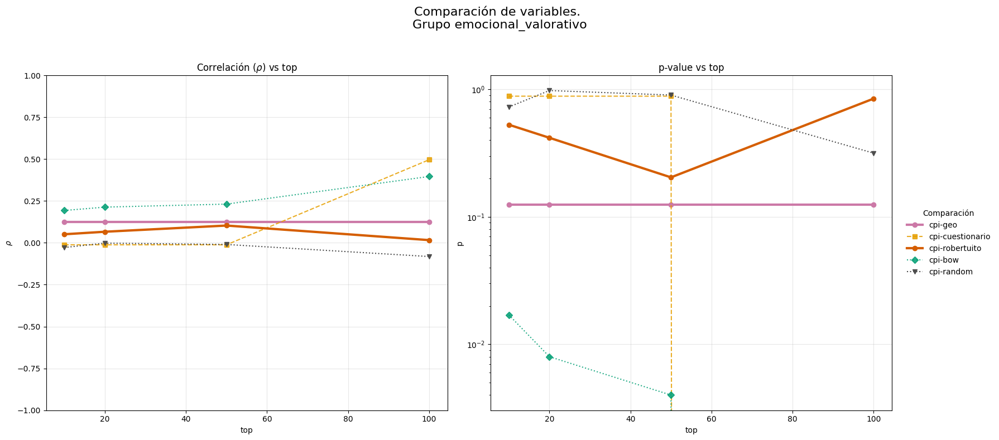

Analizando grupo institucional...
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.5790 para mantener 1 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.5790 para mantener 1 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.5790 para mantener 1 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])


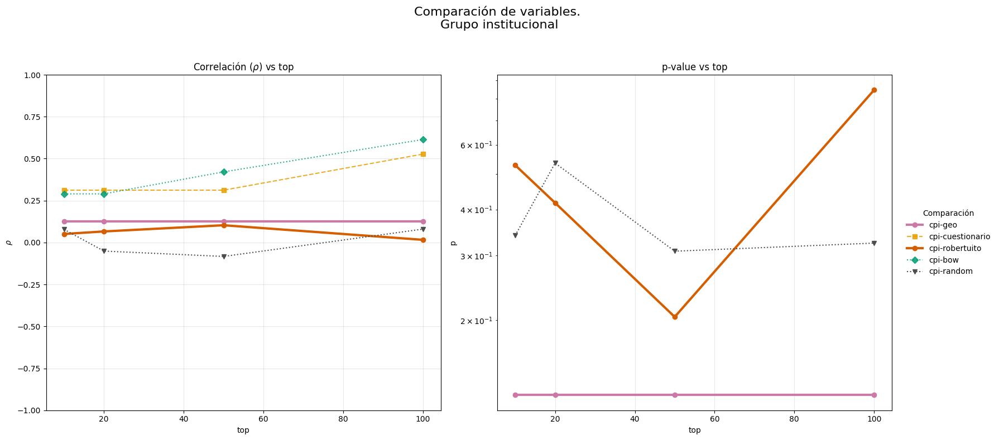

Analizando grupo delitos_practicas_corruptas...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: A

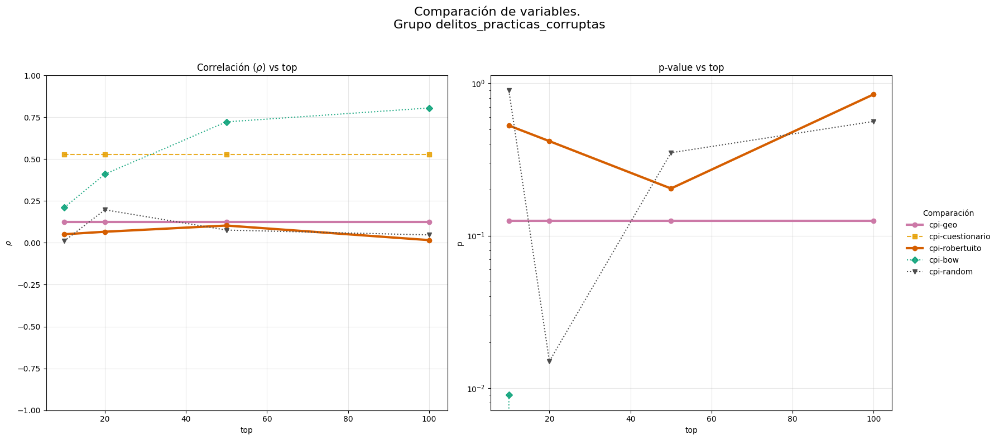

Analizando grupo participacion_transparencia...
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.5224 para mantener 1 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: A

Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.5224 para mantener 1 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: A

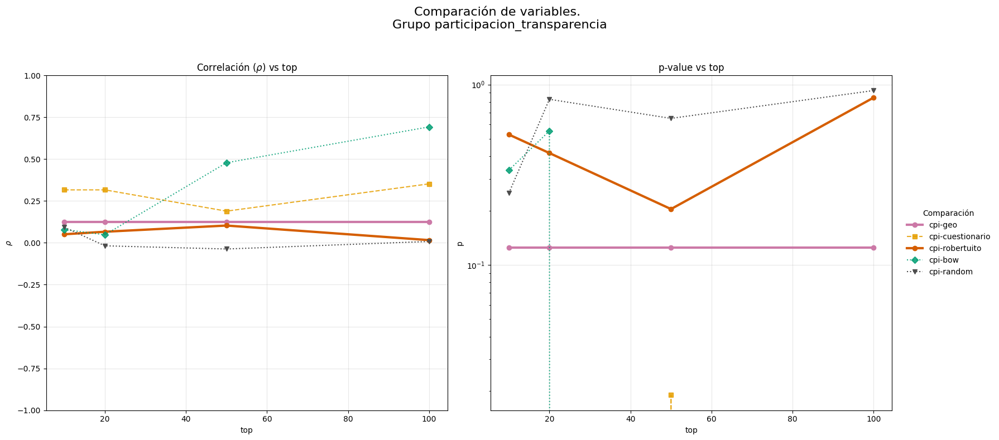

Analizando grupo actores_entidades...
Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4487 para mantener 1 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: A

Advertencia: El threshold 0.6 filtró todas las características. Ajustando a 0.4487 para mantener 1 características.


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: A

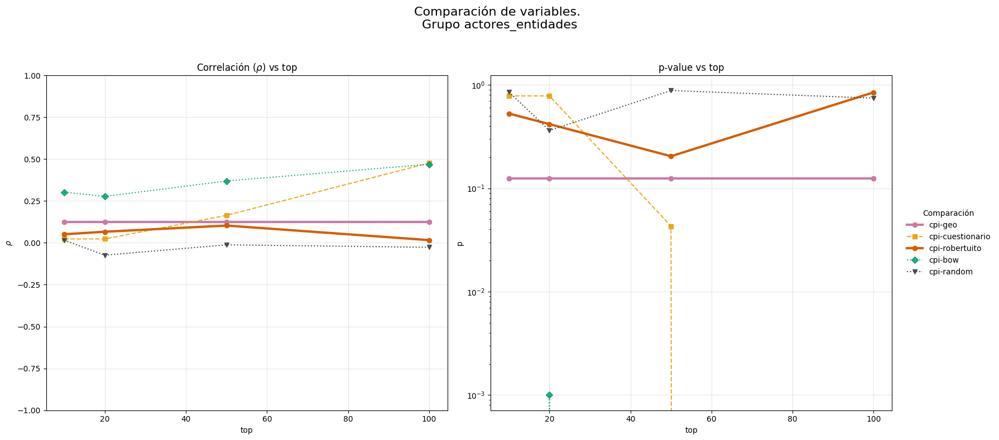

Analizando grupo ruido...


/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr, p = spearmanr(y[m], x[m])
/home/juancho/OneDrive/MCC/programas/proyecto_tecnologico/codigos/search_results_lib.py:802: ConstantInputWarning: A

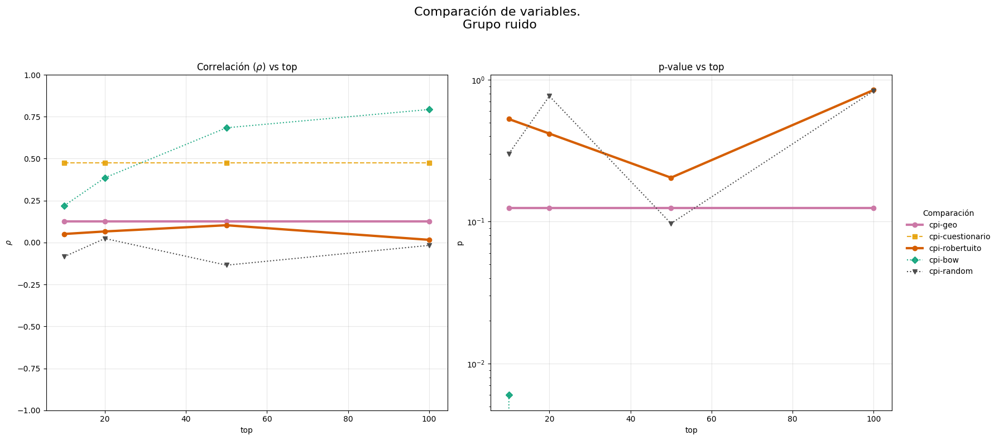

In [86]:
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'bow': t
}

forms_groups_dict = {'emocional_valorativo': ['emociones__b', 'emociones__e'],
    'institucional': ['involucrados__b'],
    'delitos_practicas_corruptas': [],
    'participacion_transparencia': ['intencion__c', 'consecuencias__a', 'consecuencias__b'],
    'actores_entidades': ['involucrados__c', 'involucrados__g', 'tipo_entidad__c'],
    'ruido': []
}
with open('../datos/clasificacion_terminos.json', 'r') as f:
    bow_groups_dict = json.load(f)
bow_groups_dict['institucional'] = bow_groups_dict['institucional'] + bow_groups_dict['politico_electoral']
bow_groups_dict['politico_electoral']

for group in forms_groups_dict.keys():
    print(f"Analizando grupo {group}...")
    
    df_group_dict = {}
    for key in df_dict:
        if key in ['cuestionario', 'bow']:
            df_group_dict[key] = df_dict[key][forms_groups_dict[group] if key == 'cuestionario' else bow_groups_dict[group]]
            if df_group_dict[key].shape[1] == 0:
                df_group_dict.pop(key)
        else:
            df_group_dict[key] = df_dict[key]
    thres_group = {key: thres[key] for key in df_group_dict if key in thres}

    wide_r, wide_p = srl.compare_research_variables(
        df_group_dict, 
        tops, 
        corr_dict, 
        analysis_func='distance',
        keys=thres_group.keys(),
        thres_dict=thres,
        ignore=ignore, 
        segmentation=segmentation,
        expanded=True, 
        filter_by='correlation',
        #seg_feat_dict=
        #measure_relation_by='correlation',
        compare_to=df_dict["cpi"][['cpi']],
        #print_progress=True,
        min_features_ratio=0.0001
    )

    srl.graph_comparison(
        wide_r, 
        wide_p, 
        extra=f"\nGrupo {group}",
        highlight_palette=HIGHLIGHT_COLORS
    )

Analizando grupo emocional_valorativo...


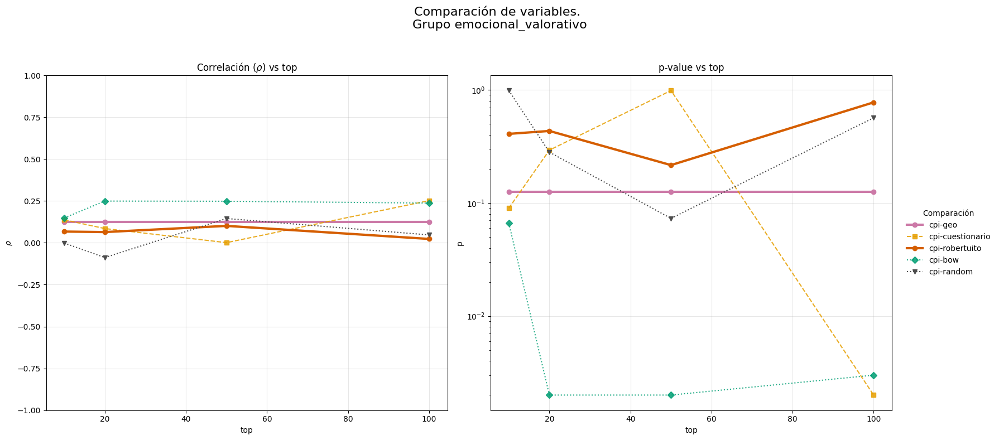

Analizando grupo institucional...


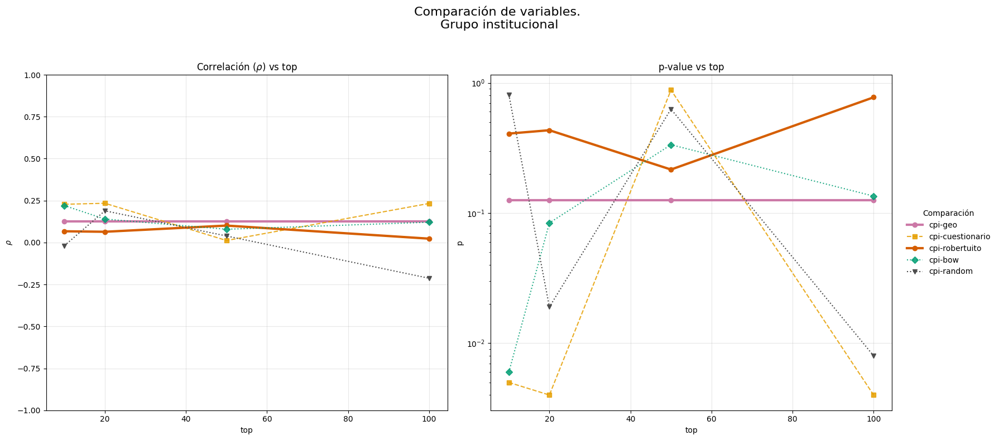

Analizando grupo delitos_practicas_corruptas...


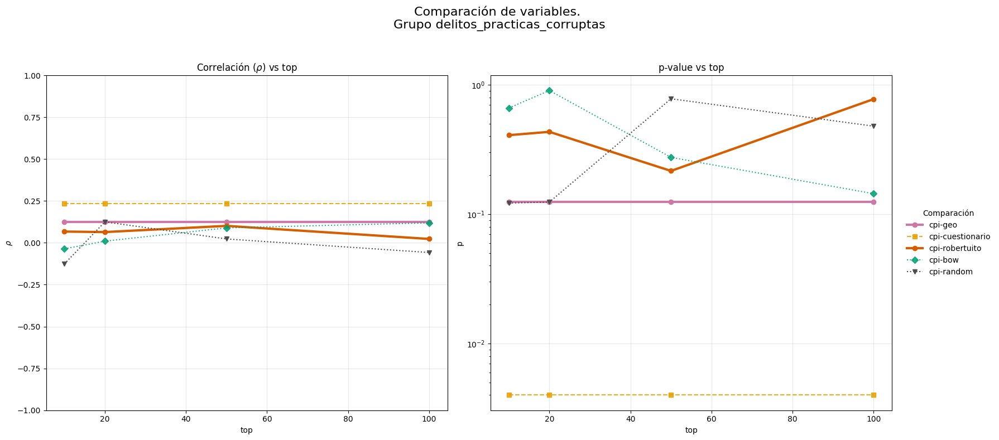

Analizando grupo participacion_transparencia...


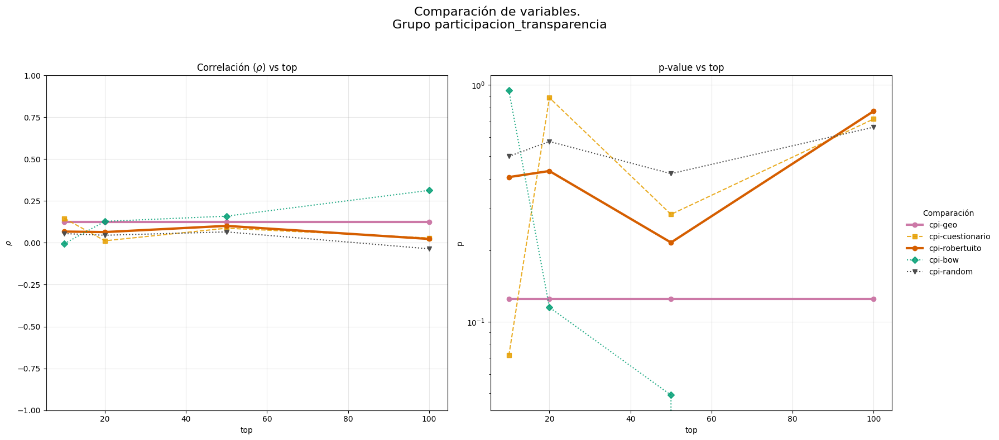

Analizando grupo actores_entidades...


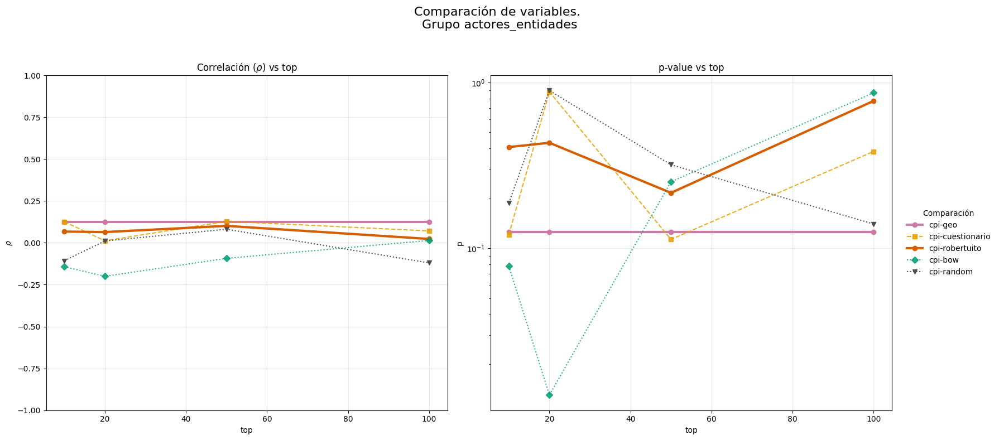

Analizando grupo ruido...


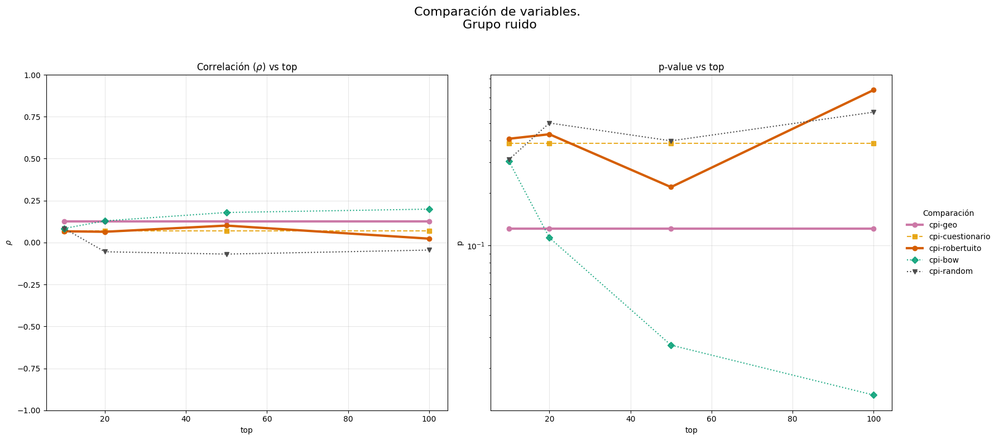

In [94]:
t = 0.6
thres = {
    'cuestionario': t,
    'robertuito': 0,
    'bow': t
}

forms_groups_dict = {'emocional_valorativo': ['emociones__b', 'emociones__e'],
    'institucional': ['involucrados__b'],
    'delitos_practicas_corruptas': [],
    'participacion_transparencia': ['intencion__c', 'consecuencias__a', 'consecuencias__b'],
    'actores_entidades': ['involucrados__c', 'involucrados__g', 'tipo_entidad__c'],
    'ruido': []
}
with open('../datos/clasificacion_terminos.json', 'r') as f:
    bow_groups_dict = json.load(f)
bow_groups_dict['institucional'] = bow_groups_dict['institucional'] + bow_groups_dict['politico_electoral']
bow_groups_dict['politico_electoral']

for group in forms_groups_dict.keys():
    print(f"Analizando grupo {group}...")
    
    df_group_dict = {}
    for key in df_dict:
        if key in ['cuestionario', 'bow']:
            df_group_dict[key] = df_dict[key][forms_groups_dict[group] if key == 'cuestionario' else bow_groups_dict[group]]
            if df_group_dict[key].shape[1] == 0:
                df_group_dict.pop(key)
        else:
            df_group_dict[key] = df_dict[key]
    thres_group = {key: thres[key] for key in df_group_dict if key in thres}

    wide_r, wide_p = srl.compare_research_variables(
        df_group_dict, 
        tops, 
        corr_dict, 
        analysis_func='distance',
        keys=thres_group.keys(),
        thres_dict=thres,
        ignore=ignore, 
        segmentation=segmentation,
        expanded=True, 
        filter_by='no_filter',
        #seg_feat_dict=
        #measure_relation_by='correlation',
        compare_to=df_dict["cpi"][['cpi']],
        #print_progress=True,
        min_features_ratio=0.0001
    )

    srl.graph_comparison(
        wide_r, 
        wide_p, 
        extra=f"\nGrupo {group}",
        highlight_palette=HIGHLIGHT_COLORS
    )